In [1]:
import matplotlib, sys,  os
os.environ['OPENBLAS_NUM_THREADS'] = '1'
os.environ['OMP_NUM_THREADS'] = '1'
os.environ['MKL_NUM_THREADS'] = '1'
os.environ['NUMEXPR_NUM_THREADS'] = '1'
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
sys.path.append("./mylib/")

import numpy as np
matplotlib.use('Agg')
import matplotlib.pyplot as plt

from threeML import *
from WCDA_hal import HAL, HealpixConeROI, HealpixMapROI
import traceback
import warnings
# warnings.simplefilter("ignore")
silence_warnings()
from threeML import silence_progress_bars, activate_progress_bars, toggle_progress_bars
from threeML.utils.progress_bar import trange

from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
from astropy import units as u
# from astropy.visualization import astropy_mpl_style, imshAow_norm
from astropy.coordinates import Angle

import healpy as hp

from tqdm import tqdm

# from mylib import *
import mylib as my
from importlib import reload

Welcome to JupyROOT 6.24/06


12:50:45 WARNING   The GSL library or the pygsl wrapper cannot be loaded. Models that depend on it  ]8;id=753691;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/astromodels/functions/functions_1D/functions.py\functions.py]8;;\:]8;id=957732;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/astromodels/functions/functions_1D/functions.py#71\71]8;;\
                  will not be available.                                                                           

12:50:46 INFO      Starting 3ML!                                                                     ]8;id=743653;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=943379;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/__init__.py#35\35]8;;\

         WARNING   WARNINGs here are NOT errors                                                      ]8;id=781819;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=172462;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/__init__.py#36\36]8;;\

         WARNING   but are inform you about optional packages that can be installed                  ]8;id=888061;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=819030;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/__init__.py#37\37]8;;\

         WARNING    to disable these messages, turn off start_warning in your config file            ]8;id=89694;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=926167;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/__init__.py#40\40]8;;\

12:50:49 WARNING   The cthreeML package is not installed. You will not be able to use plugins which  ]8;id=777996;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=589476;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/__init__.py#94\94]8;;\
                  require the C/C++ interface (currently HAWC)                                                     

         WARNING   Could not import plugin FermiLATLike.py. Do you have the relative instrument     ]8;id=458468;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=921593;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/__init__.py#144\144]8;;\
                  software installed and configured?                                                               

         WARNING   Could not import plugin HAWCLike.py. Do you have the relative instrument         ]8;id=463320;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=582048;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/__init__.py#144\144]8;;\
                  software installed and configured?                                                               

12:50:50 WARNING   No fermitools installed                                              ]8;id=232863;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/utils/data_builders/fermi/lat_transient_builder.py\lat_transient_builder.py]8;;\:]8;id=651198;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/utils/data_builders/fermi/lat_transient_builder.py#44\44]8;;\


WARNING NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "process_dec_bins" failed type inference due to: Use of unsupported NumPy function 'numpy.einsum' or unsupported use of the function.

File "../../../../.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py", line 39:
def process_dec_bins(sflux, w1, w2, ss1, ss2):
    ss1_sum = np.einsum('ij,j->i', sflux, ss1) * w1
    ^

During: typing of get attribute at /data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py (39)

File "../../../../.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py", line 39:
def process_dec_bins(sflux, w1, w2, ss1, ss2):
    ss1_sum = np.einsum('ij,j->i', sflux, ss1) * w1
    ^



WARNING NumbaWarning: Function "process_dec_bins" was compiled in object mode without forceobj=Tru

Yourlib init successfully!!!


Load sub from Mystat: : 40it [00:19, 44.80it/s]

Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(6.1 +/- 1.9) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1505.552653
total,1505.552653


Values of statistical measures:

,statistical measures
AIC,3013.105328
BIC,3023.221006


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(0.9 +/- 1.4) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1384.114668
total,1384.114668


Values of statistical measures:

,statistical measures
AIC,2770.229358
BIC,2780.345035


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(1.3 +/- 1.5) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1365.599182
total,1365.599182


Values of statistical measures:

,statistical measures
AIC,2733.198386
BIC,2743.314064


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(2.3 +/- 1.4) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1316.378129
total,1316.378129


Values of statistical measures:

,statistical measures
AIC,2634.756280
BIC,2644.871957


100%|██████████| 6/6 [01:36<00:00, 16.11s/it]


processing MLE analyses:   0%|          | 0/1 [00:00<?, ?it/s]

Propagating errors:   0%|          | 0/30 [00:00<?, ?it/s]


WARNING UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go" (-> color='g'). The keyword argument will take precedence.



14:29:42 INFO      Region of Interest:                                                                   ]8;id=906258;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=717276;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#292\292]8;;\

         INFO      -------------------                                                                   ]8;id=630423;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=82877;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#293\293]8;;\

         INFO      HealpixMapROI: Center (R.A., Dec) = (86.405, 28.936), model radius: 9.000 ]8;id=898369;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/region_of_interest/healpix_map_roi.py\healpix_map_roi.py]8;;\:]8;id=751089;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/region_of_interest/healpix_map_roi.py#134\134]8;;\
                  deg, display radius: 7.000 deg, threshold = 0.50                                                 

         INFO                                                                                            ]8;id=515842;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=556494;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#296\296]8;;\

         INFO      Flat sky projection:                                                                  ]8;id=204027;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=607501;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#297\297]8;;\

         INFO      --------------------                                                                  ]8;id=826499;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=392896;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#298\298]8;;\

         INFO      Width x height 106 x 106 px                                                           ]8;id=180302;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=65909;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#300\300]8;;\

         INFO      Pixel sizes: 0.17 deg                                                                 ]8;id=412157;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=302413;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#305\305]8;;\

         INFO                                                                                            ]8;id=439884;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=854972;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#308\308]8;;\

         INFO      Response:                                                                             ]8;id=646380;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=70726;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#309\309]8;;\

         INFO      ---------                                                                             ]8;id=809295;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=723979;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#310\310]8;;\

         INFO      Response file:                                                                   ]8;id=393263;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=885480;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#340\340]8;;\
                  /data/home/cwy/Science/3MLWCDA/Standard/src/../../data/DR_ihep_MK2_newoldDRpsf.ro                
                  ot                                                                                               

         INFO      Number of dec bins: 110                                                          ]8;id=861204;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=765873;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#341\341]8;;\

         INFO      Number of energy/nHit planes per dec bin_name: 6                                 ]8;id=550401;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=350537;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#344\344]8;;\

         INFO                                                                                            ]8;id=394527;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=936667;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#314\314]8;;\

         INFO      Map Tree:                                                                             ]8;id=649659;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=598695;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#315\315]8;;\

         INFO      ----------                                                                            ]8;id=756841;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=102007;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#316\316]8;;\

,Bin,Nside,Scheme,Obs counts,Bkg counts,obs/bkg,Pixels in ROI,Area (deg^2)
0,0,1024,RING,1.945525e+07,1.943149e+07,1.001223,30463,99.872665
1,1,1024,RING,9.441521e+06,9.423155e+06,1.001949,30463,99.872665
2,2,1024,RING,1.562767e+06,1.555841e+06,1.004452,30463,99.872665
3,3,1024,RING,6.546186e+05,6.499964e+05,1.007111,30463,99.872665
4,4,1024,RING,1.739701e+05,1.720830e+05,1.010966,30463,99.872665
5,5,1024,RING,4.374884e+04,4.299504e+04,1.017532,30463,99.872665


         INFO      This Map Tree contains 795.961 transits in the first bin                         ]8;id=718297;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py\map_tree.py]8;;\:]8;id=96891;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py#149\149]8;;\

         INFO      Total data size: 2.92 Mb                                                         ]8;id=399323;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py\map_tree.py]8;;\:]8;id=229019;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py#151\151]8;;\

         INFO                                                                                            ]8;id=71304;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=420664;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#320\320]8;;\

         INFO      Active energy/nHit planes (6):                                                        ]8;id=190408;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=431493;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#322\322]8;;\

         INFO      -------------------------------                                                       ]8;id=40916;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=902272;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#323\323]8;;\

         INFO      ['0', '1', '2', '3', '4', '5']                                                        ]8;id=780450;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=877313;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#324\324]8;;\

14:29:43 INFO      Set WCDA tansit from: 795.9613310185185 to 796.2928263888889                         ]8;id=867525;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Mymap.py\Mymap.py]8;;\:]8;id=975202;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Mymap.py#41\41]8;;\

14:29:44 INFO      J0534P3533 in model_radius: 9 sf:True pf:True kf:True indexf:True                   ]8;id=883335;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=909517;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#329\329]8;;\

         INFO      Spec:                                                                               ]8;id=585679;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=812785;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#350\350]8;;\
                   K=4.30e-14 kb=(1.00e-15, 2.63e-13) index=-2.37 indexb=(-4.00,-1.00)                             

         INFO      Mor: fitrange=1.44                                                                  ]8;id=290251;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=436555;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#360\360]8;;\

         INFO      J0534P2200u in model_radius: 9 sf:True pf:True kf:True indexf:True                  ]8;id=348317;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=484741;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#329\329]8;;\

         INFO      Spec:                                                                               ]8;id=751506;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=618368;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#350\350]8;;\
                   K=2.11e-12 kb=(2.11e-14, 2.33e-12) index=-2.69 indexb=(-2.79,-2.59)                             

         INFO      Mor: fitrange=0.03                                                                  ]8;id=367637;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=69787;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#360\360]8;;\

         INFO      J0542P2311u in roi: 7 sf:True pf:True kf:False indexf:False                         ]8;id=556718;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=477543;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#322\322]8;;\

         INFO      Spec:                                                                               ]8;id=920877;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=312688;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#350\350]8;;\
                   K=2.08e-13 kb=(2.08e-15, 1.29e-12) index=-1.95 indexb=(-3.25,-1.00)                             

         INFO      Mor:                                                                                ]8;id=828071;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=808670;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#352\352]8;;\
                   sigma=1.45 sb=(0.01,2.89) fitrange=4.00                                                         

14:29:45 INFO      Set diffuse range: [172.0, 188.0] [-8, 8]                                          ]8;id=192437;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=734571;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1215\1215]8;;\

         INFO      ra dec coner:                                                                      ]8;id=591166;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=339144;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1216\1216]8;;\

         INFO      (73.5674098050747, 30.927365060486235)                                             ]8;id=908093;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=377534;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1217\1217]8;;\

         INFO      (83.5743647498725, 17.94204395620837)                                              ]8;id=598342;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=437414;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1218\1218]8;;\

         INFO      (98.62526866642222, 25.783778365226297)                                            ]8;id=846838;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=903950;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1219\1219]8;;\

         INFO      (89.913831338509, 39.856901244813585)                                              ]8;id=566679;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=574246;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1220\1220]8;;\

         INFO      total sr: 0.07772890321151499                                                      ]8;id=769794;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=327252;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1259\1259]8;;\
                  ratio: 0.028307125215400412                                                                      

         INFO      integration: 4.4789944564473105e-06                                                ]8;id=407295;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=589593;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1260\1260]8;;\
                  ratio: 0.03534624073896865                                                                       

         INFO      set K to: 6.33743420548785e-13                                                     ]8;id=791311;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=907752;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1261\1261]8;;\

         INFO      diffuse file path: ../../data/Diffuse_WCDA_case14_dust_bkg_template.fits           ]8;id=293822;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=32943;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1288\1288]8;;\

Model summary:
==============

                  N
Point sources     2
Extended sources  2
Particle sources  0

Free parameters (4):
--------------------

                                         value min_value max_value   
J0542P2311u.spectrum.main.Powerlaw.K       0.0       0.0       0.0  \
J0542P2311u.spectrum.main.Powerlaw.index -1.95     -3.25      -1.0   
Diffuse.spectrum.main.Powerlaw.K           0.0       0.0       0.0   
Diffuse.spectrum.main.Powerlaw.index      -2.5      -4.5      -0.5   

                                                    unit  
J0542P2311u.spectrum.main.Powerlaw.K      keV-1 s-1 cm-2  
J0542P2311u.spectrum.main.Powerlaw.index                  
Diffuse.spectrum.main.Powerlaw.K          keV-1 s-1 cm-2  
Diffuse.spectrum.main.Powerlaw.index                      

Fixed parameters (18):
---------------------

                                                                                      value   
J0534P3533.position.ra                                                                83.38  \
J0534P3533.position.dec                                                               35.48   
J0534P3533.spectrum.main.Powerlaw.K                                                     0.0   
J0534P3533.spectrum.main.Powerlaw.piv                                          3000000000.0   
J0534P3533.spectrum.main.Powerlaw.index                                               -2.37   
J0534P2200u.position.ra                                                               83.62   
J0534P2200u.position.dec                                                              22.01   
J0534P2200u.spectrum.main.Powerlaw.K                                                    0.0   
J0534P2200u.spectrum.main.Powerlaw.piv                                         3000000000.0   
J0534P2200u.spectrum.main.Powerlaw.index                                              -2.69   
J0542P2311u.Gaussian_on_sphere.lon0                                                   86.07   
J0542P2311u.Gaussian_on_sphere.lat0                                                   23.19   
J0542P2311u.Gaussian_on_sphere.sigma                                                   1.45   
J0542P2311u.spectrum.main.Powerlaw.piv                                         3000000000.0   
Diffuse.SpatialTemplate_2D.K                                                            1.0   
Diffuse.SpatialTemplate_2D.hash           1528672842603063783919355898758668760315634518...   
Diffuse.SpatialTemplate_2D.ihdu                                                         0.0   
Diffuse.spectrum.main.Powerlaw.piv                                             3000000000.0   

                                         min_value max_value            unit  
J0534P3533.position.ra                       81.94     84.82             deg  
J0534P3533.position.dec                      34.04     36.92             deg  
J0534P3533.spectrum.main.Powerlaw.K            0.0       0.0  keV-1 s-1 cm-2  
J0534P3533.spectrum.main.Powerlaw.piv         None      None             keV  
J0534P3533.spectrum.main.Powerlaw.index       -4.0      -1.0                  
J0534P2200u.position.ra                     83.588    83.652             deg  
J0534P2200u.position.dec                    21.978    22.042             deg  
J0534P2200u.spectrum.main.Powerlaw.K           0.0       0.0  keV-1 s-1 cm-2  
J0534P2200u.spectrum.main.Powerlaw.piv        None      None             keV  
J0534P2200u.spectrum.main.Powerlaw.index     -2.79     -2.59                  
J0542P2311u.Gaussian_on_sphere.lon0          82.07     90.07             deg  
J0542P2311u.Gaussian_on_sphere.lat0          19.19     27.19             deg  
J0542P2311u.Gaussian_on_sphere.sigma          0.01      2.89             deg  
J0542P2311u.spectrum.main.Powerlaw.piv        None      None             keV  
Diffuse.SpatialTemplate_2D.K                  None      None           deg-2  
Diffuse.SpatialTemplate_2D.hash               None      None                  
Dif

14:29:46 INFO      Considering 12 dec bins for extended source J0542P2311u          ]8;id=557776;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=32368;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 23.190                      ]8;id=996661;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=884295;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 21 dec bins for extended source Diffuse              ]8;id=55279;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=371005;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 28.865                      ]8;id=28499;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=519495;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      set the minimizer to minuit                                             ]8;id=85091;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py\joint_likelihood.py]8;;\:]8;id=633584;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py#1042\1042]8;;\

         INFO      set the minimizer to ROOT                                               ]8;id=724063;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py\joint_likelihood.py]8;;\:]8;id=75860;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py#1059\1059]8;;\

Best fit values:

,result,unit
parameter,,
J0542P2311u.spectrum.main.Powerlaw.K,(1.5 -0.4 +0.5) x 10^-22,1 / (keV s cm2)
J0542P2311u.spectrum.main.Powerlaw.index,-1.73 +/- 0.15,
Diffuse.spectrum.main.Powerlaw.K,(6.3 -0.8 +0.9) x 10^-22,1 / (keV s cm2)
Diffuse.spectrum.main.Powerlaw.index,-2.60 +/- 0.13,


Correlation matrix:

1.00,-0.95,-0.22,0.14
-0.95,1.00,0.14,-0.20
-0.22,0.14,1.00,0.02
0.14,-0.20,0.02,1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA,8156.702917
total,8156.702917


Values of statistical measures:

,statistical measures
AIC,16321.406053
BIC,16361.869945


Smoothing planes:   0%|          | 0/6 [00:00<?, ?it/s]

14:30:02 INFO      Considering 12 dec bins for extended source J0542P2311u          ]8;id=649561;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=870385;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 23.190                      ]8;id=515919;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=164966;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 21 dec bins for extended source Diffuse              ]8;id=582187;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=672404;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 28.865                      ]8;id=165090;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=472323;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\


WARNING RuntimeWarning: invalid value encountered in sqrt



(84.90234375, 27.91096640592604)


<Figure size 640x480 with 0 Axes>

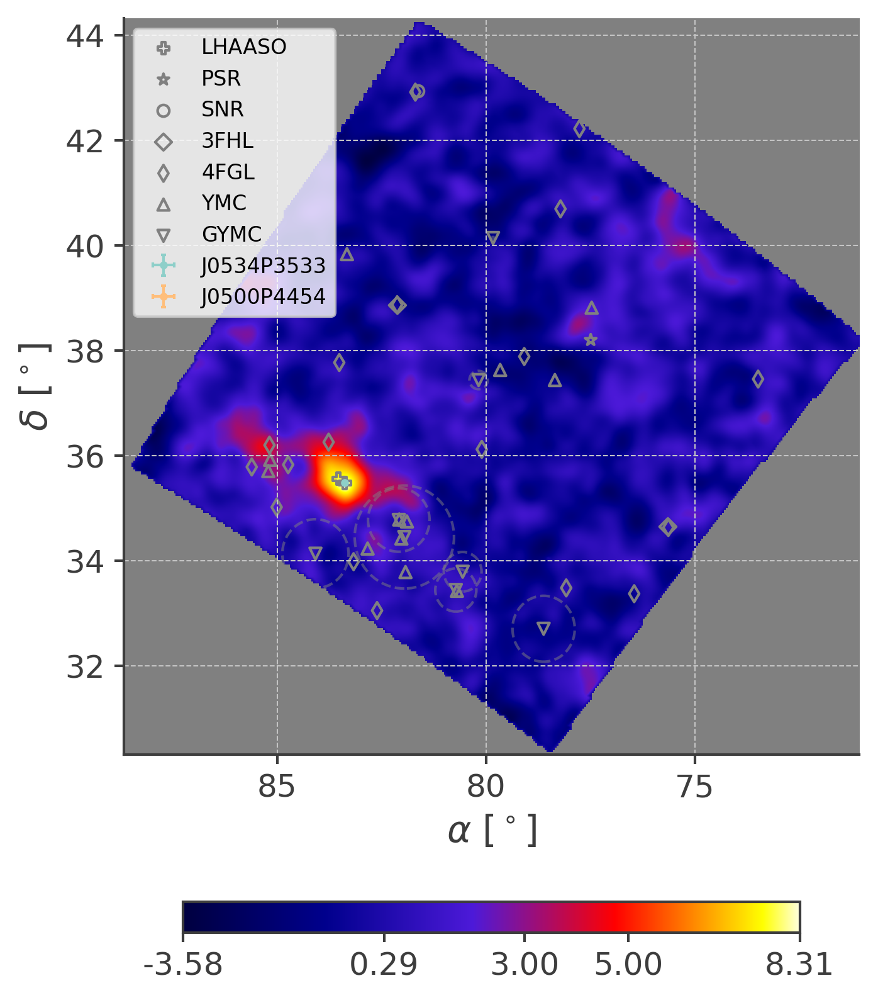

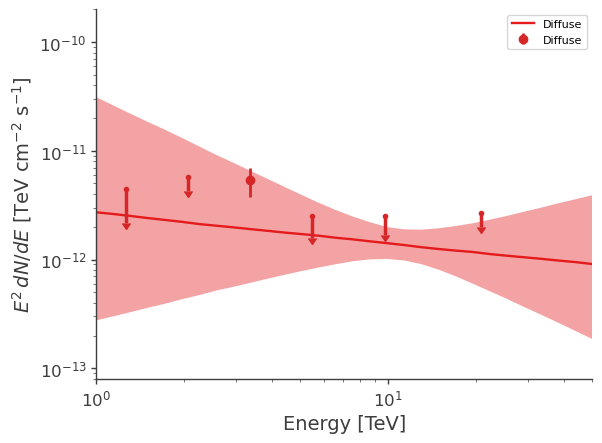

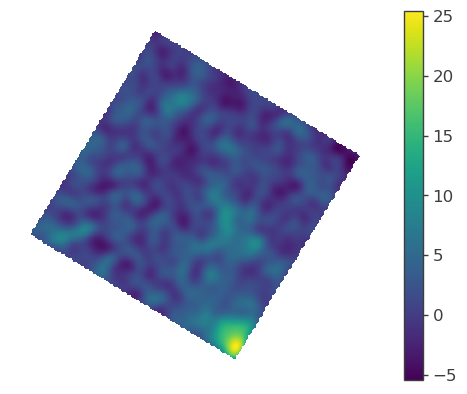

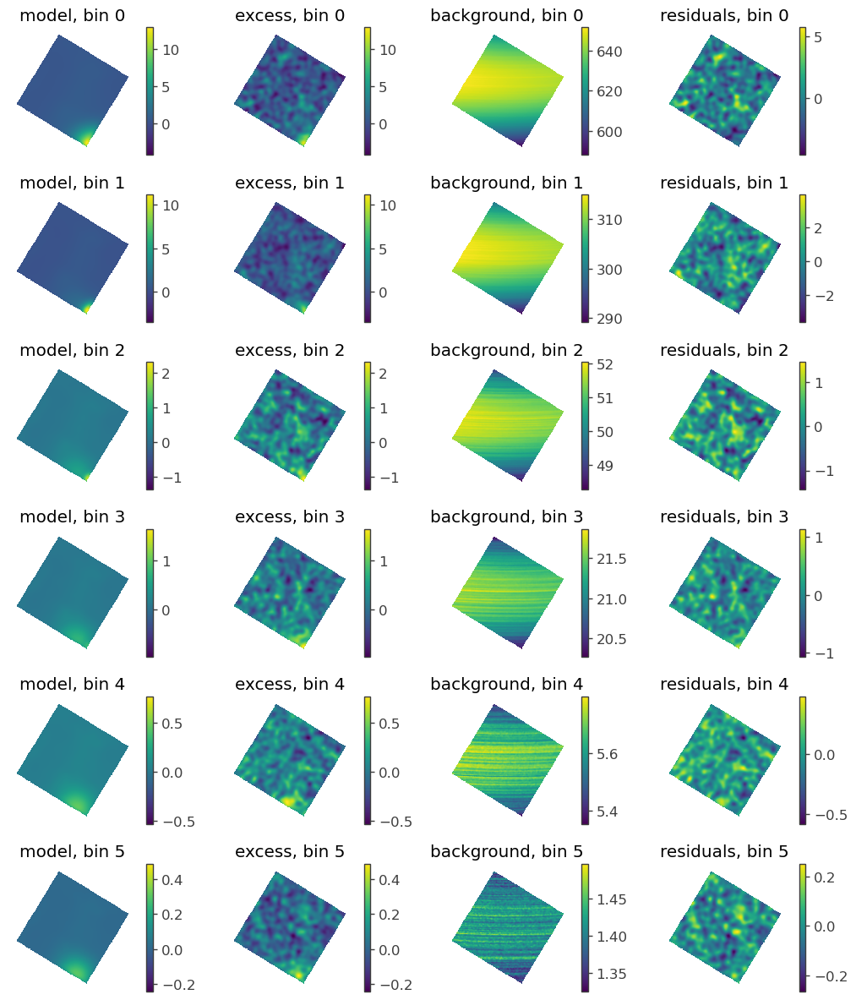

<Figure size 640x480 with 0 Axes>

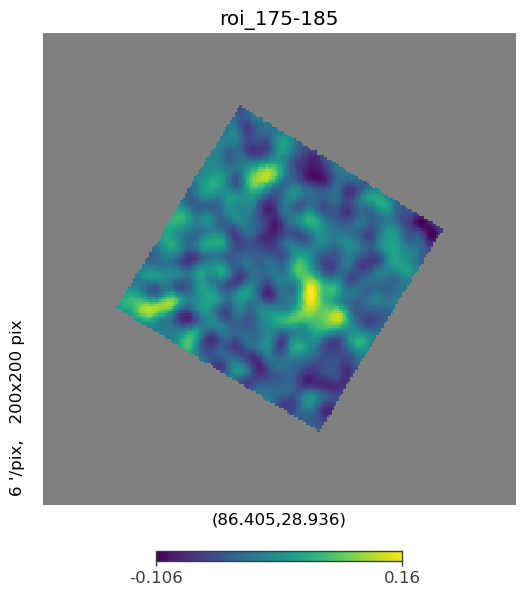

LHAASO:  1 83.53 35.56  1WCDA J0534+3533  0.0
LHAASO:  2 83.38 35.48  1LHAASO J0534+3533   0.0
LHAASO:  3 83.62 22.01 1LHAASO J0534+2200u  0.0
LHAASO:  4 83.61 22.04 1LHAASO J0534+2200u   0.0
LHAASO:  5 85.71 23.2  1LHAASO J0542+2311u  0.98
LHAASO:  6 86.07 23.19  1LHAASO J0542+2311u   1.45
LHAASO:  7 94.35 22.57 1LHAASO J0617+2234  0.59
TeVCat:  1 83.62874999999998 22.01236111111111 Crab 0.0145
TeVCat:  2 83.63291666666665 22.0145 Crab Pulsar 0.0
TeVCat:  3 85.77999999999999 23.4 HAWC J0543+233 0.5
TeVCat:  4 94.21249999999999 22.503055555555555 IC 443 0.16
PSR:  1 79.29166666666666 22.266666666666666 J0517+22
PSR:  2 82.21774999999998 22.00111111111111 J0528+2200
PSR:  3 83.63320833333333 22.01447222222222 J0534+2200
PSR:  4 84.60441666666665 28.28588888888889 J0538+2817
PSR:  5 85.15466666666666 32.127027777777776 J0540+3207
PSR:  6 85.79025 23.484722222222224 J0543+2329
PSR:  7 86.61983333333332 24.689166666666665 J0546+2441
PSR:  8 88.52087499999999 31.128055555555555 J0554+3107
P

Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(4.0 +/- 1.8) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1375.794674
total,1375.794674


Values of statistical measures:

,statistical measures
AIC,2753.589370
BIC,2763.705375


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(6.7 +/- 1.6) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1388.072003
total,1388.072003


Values of statistical measures:

,statistical measures
AIC,2778.144028
BIC,2788.260034


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(9.5 +/- 2.0) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1402.105803
total,1402.105803


Values of statistical measures:

,statistical measures
AIC,2806.211627
BIC,2816.327633


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(7.6 +/- 1.9) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1388.688483
total,1388.688483


Values of statistical measures:

,statistical measures
AIC,2779.376989
BIC,2789.492995


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(4.3 +/- 2.4) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1328.466381
total,1328.466381


Values of statistical measures:

,statistical measures
AIC,2658.932783
BIC,2669.048789


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(3.6 +/- 3.0) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1270.529082
total,1270.529082


Values of statistical measures:

,statistical measures
AIC,2543.058185
BIC,2553.174191


100%|██████████| 6/6 [01:36<00:00, 16.05s/it]


processing MLE analyses:   0%|          | 0/1 [00:00<?, ?it/s]

Propagating errors:   0%|          | 0/30 [00:00<?, ?it/s]


WARNING UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go" (-> color='g'). The keyword argument will take precedence.



14:33:03 INFO      Region of Interest:                                                                   ]8;id=89150;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=935741;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#292\292]8;;\

         INFO      -------------------                                                                   ]8;id=345871;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=550331;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#293\293]8;;\

         INFO      HealpixMapROI: Center (R.A., Dec) = (91.940, 20.290), model radius: 9.000 ]8;id=13434;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/region_of_interest/healpix_map_roi.py\healpix_map_roi.py]8;;\:]8;id=570681;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/region_of_interest/healpix_map_roi.py#134\134]8;;\
                  deg, display radius: 7.000 deg, threshold = 0.50                                                 

         INFO                                                                                            ]8;id=96862;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=264341;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#296\296]8;;\

         INFO      Flat sky projection:                                                                  ]8;id=928452;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=163732;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#297\297]8;;\

         INFO      --------------------                                                                  ]8;id=753709;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=548941;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#298\298]8;;\

         INFO      Width x height 106 x 106 px                                                           ]8;id=181004;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=164454;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#300\300]8;;\

         INFO      Pixel sizes: 0.17 deg                                                                 ]8;id=774067;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=553056;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#305\305]8;;\

         INFO                                                                                            ]8;id=476815;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=601350;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#308\308]8;;\

         INFO      Response:                                                                             ]8;id=187894;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=641307;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#309\309]8;;\

         INFO      ---------                                                                             ]8;id=51497;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=83567;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#310\310]8;;\

         INFO      Response file:                                                                   ]8;id=878080;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=765625;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#340\340]8;;\
                  /data/home/cwy/Science/3MLWCDA/Standard/src/../../data/DR_ihep_MK2_newoldDRpsf.ro                
                  ot                                                                                               

         INFO      Number of dec bins: 110                                                          ]8;id=883295;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=597711;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#341\341]8;;\

         INFO      Number of energy/nHit planes per dec bin_name: 6                                 ]8;id=341427;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=906802;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#344\344]8;;\

         INFO                                                                                            ]8;id=393555;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=99908;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#314\314]8;;\

         INFO      Map Tree:                                                                             ]8;id=803260;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=269136;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#315\315]8;;\

         INFO      ----------                                                                            ]8;id=733948;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=574719;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#316\316]8;;\

,Bin,Nside,Scheme,Obs counts,Bkg counts,obs/bkg,Pixels in ROI,Area (deg^2)
0,0,1024,RING,1.713726e+07,1.709236e+07,1.002627,30459,99.859551
1,1,1024,RING,8.494355e+06,8.454717e+06,1.004688,30459,99.859551
2,2,1024,RING,1.433314e+06,1.419147e+06,1.009983,30459,99.859551
3,3,1024,RING,6.087954e+05,5.984808e+05,1.017235,30459,99.859551
4,4,1024,RING,1.637581e+05,1.590716e+05,1.029462,30459,99.859551
5,5,1024,RING,4.224762e+04,4.008967e+04,1.053828,30459,99.859551


         INFO      This Map Tree contains 795.961 transits in the first bin                         ]8;id=164123;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py\map_tree.py]8;;\:]8;id=414663;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py#149\149]8;;\

         INFO      Total data size: 2.92 Mb                                                         ]8;id=663723;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py\map_tree.py]8;;\:]8;id=489898;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py#151\151]8;;\

         INFO                                                                                            ]8;id=441504;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=325985;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#320\320]8;;\

         INFO      Active energy/nHit planes (6):                                                        ]8;id=123970;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=941863;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#322\322]8;;\

         INFO      -------------------------------                                                       ]8;id=740621;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=762091;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#323\323]8;;\

         INFO      ['0', '1', '2', '3', '4', '5']                                                        ]8;id=651641;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=624914;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#324\324]8;;\

14:33:04 INFO      Set WCDA tansit from: 795.9613310185185 to 796.2928263888889                         ]8;id=51702;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Mymap.py\Mymap.py]8;;\:]8;id=560057;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Mymap.py#41\41]8;;\

14:33:05 INFO      J0534P2200u in model_radius: 9 sf:True pf:True kf:True indexf:True                  ]8;id=401072;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=718436;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#329\329]8;;\

         INFO      Spec:                                                                               ]8;id=698886;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=450099;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#350\350]8;;\
                   K=2.11e-12 kb=(2.11e-14, 2.33e-12) index=-2.69 indexb=(-2.79,-2.59)                             

         INFO      Mor: fitrange=0.03                                                                  ]8;id=149838;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=393180;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#360\360]8;;\

         INFO      J0542P2311u in model_radius: 9 sf:True pf:True kf:True indexf:True                  ]8;id=254324;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=705014;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#329\329]8;;\

         INFO      Spec:                                                                               ]8;id=879678;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=851326;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#350\350]8;;\
                   K=2.08e-13 kb=(2.08e-15, 1.29e-12) index=-1.95 indexb=(-3.25,-1.00)                             

         INFO      Mor:                                                                                ]8;id=527175;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=975817;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#352\352]8;;\
                   sigma=1.45 sb=(0.01,2.89) fitrange=4.00                                                         

         INFO      J0617P2234 in roi: 7 sf:True pf:True kf:False indexf:False                          ]8;id=681068;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=157512;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#322\322]8;;\

         INFO      Spec:                                                                               ]8;id=376862;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=979887;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#350\350]8;;\
                   K=1.95e-13 kb=(1.95e-15, 7.35e-13) index=-2.92 indexb=(-4.00,-1.52)                             

         INFO      Mor:                                                                                ]8;id=130070;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=29955;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#352\352]8;;\
                   sigma=0.59 sb=(0.00,1.23) fitrange=1.44                                                         

         INFO      J0634P1741u in model_radius: 9 sf:True pf:True kf:True indexf:True                  ]8;id=93549;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=761296;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#329\329]8;;\

         INFO      Spec:                                                                               ]8;id=836460;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=115423;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#350\350]8;;\
                   K=1.53e-13 kb=(1.53e-15, 1.45e-12) index=-1.65 indexb=(-3.15,-1.00)                             

         INFO      Mor:                                                                                ]8;id=463289;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=947762;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#352\352]8;;\
                   sigma=1.16 sb=(0.00,2.52) fitrange=2.24                                                         

         INFO      Set diffuse range: [182.0, 198.0] [-8, 8]                                          ]8;id=500994;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=992931;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1215\1215]8;;\

         INFO      ra dec coner:                                                                      ]8;id=895986;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=726275;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1216\1216]8;;\

         INFO      (80.12267475509954, 22.92701672251479)                                             ]8;id=54733;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=894063;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1217\1217]8;;\

         INFO      (88.7665785773136, 9.417765682091762)                                              ]8;id=292699;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=162477;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1218\1218]8;;\

         INFO      (103.30929001537794, 16.891079582652903)                                           ]8;id=850174;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=180220;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1219\1219]8;;\

         INFO      (95.59754234232123, 31.096407346666265)                                            ]8;id=230376;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=940398;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1220\1220]8;;\

         INFO      total sr: 0.07772890321151499                                                      ]8;id=369765;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=509344;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1259\1259]8;;\
                  ratio: 0.028307125215400412                                                                      

         INFO      integration: 4.358551958027716e-06                                                 ]8;id=431866;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=702825;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1260\1260]8;;\
                  ratio: 0.034395761879095585                                                                      

         INFO      set K to: 6.167017292338957e-13                                                    ]8;id=214432;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=253556;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1261\1261]8;;\

         INFO      diffuse file path: ../../data/Diffuse_WCDA_case14_dust_bkg_template.fits           ]8;id=105654;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=914907;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1288\1288]8;;\

Model summary:
==============

                  N
Point sources     1
Extended sources  4
Particle sources  0

Free parameters (4):
--------------------

                                        value min_value max_value   
J0617P2234.spectrum.main.Powerlaw.K       0.0       0.0       0.0  \
J0617P2234.spectrum.main.Powerlaw.index -2.92      -4.0     -1.52   
Diffuse.spectrum.main.Powerlaw.K          0.0       0.0       0.0   
Diffuse.spectrum.main.Powerlaw.index     -2.5      -4.5      -0.5   

                                                   unit  
J0617P2234.spectrum.main.Powerlaw.K      keV-1 s-1 cm-2  
J0617P2234.spectrum.main.Powerlaw.index                  
Diffuse.spectrum.main.Powerlaw.K         keV-1 s-1 cm-2  
Diffuse.spectrum.main.Powerlaw.index                     

Fixed parameters (25):
---------------------

                                                                                      value   
J0534P2200u.position.ra                                                               83.62  \
J0534P2200u.position.dec                                                              22.01   
J0534P2200u.spectrum.main.Powerlaw.K                                                    0.0   
J0534P2200u.spectrum.main.Powerlaw.piv                                         3000000000.0   
J0534P2200u.spectrum.main.Powerlaw.index                                              -2.69   
J0542P2311u.Gaussian_on_sphere.lon0                                                   86.07   
J0542P2311u.Gaussian_on_sphere.lat0                                                   23.19   
J0542P2311u.Gaussian_on_sphere.sigma                                                   1.45   
J0542P2311u.spectrum.main.Powerlaw.K                                                    0.0   
J0542P2311u.spectrum.main.Powerlaw.piv                                         3000000000.0   
J0542P2311u.spectrum.main.Powerlaw.index                                              -1.95   
J0617P2234.Gaussian_on_sphere.lon0                                                    94.35   
J0617P2234.Gaussian_on_sphere.lat0                                                    22.57   
J0617P2234.Gaussian_on_sphere.sigma                                                    0.59   
J0617P2234.spectrum.main.Powerlaw.piv                                          3000000000.0   
J0634P1741u.Gaussian_on_sphere.lon0                                                   98.51   
J0634P1741u.Gaussian_on_sphere.lat0                                                   17.72   
J0634P1741u.Gaussian_on_sphere.sigma                                                   1.16   
J0634P1741u.spectrum.main.Powerlaw.K                                                    0.0   
J0634P1741u.spectrum.main.Powerlaw.piv                                         3000000000.0   
J0634P1741u.spectrum.main.Powerlaw.index                                              -1.65   
Diffuse.SpatialTemplate_2D.K                                                            1.0   
Diffuse.SpatialTemplate_2D.hash           2272430440600793403628629127653514588090936520...   
Diffuse.SpatialTemplate_2D.ihdu                                                         0.0   
Diffuse.spectrum.main.Powerlaw.piv                                             3000000000.0   

                                         min_value max_value            unit  
J0534P2200u.position.ra                     83.588    83.652             deg  
J0534P2200u.position.dec                    21.978    22.042             deg  
J0534P2200u.spectrum.main.Powerlaw.K           0.0       0.0  keV-1 s-1 cm-2  
J0534P2200u.spectrum.main.Powerlaw.piv        None      None             keV  
J0534P2200u.spectrum.main.Powerlaw.index     -2.79     -2.59                  
J0542P2311u.Gaussian_on_sphere.lon0          82.07     90.07             deg  
J0542P2311u.Gaussian_on_sphere.lat0          19.19     27.19             deg  
J0542P2311u.Gaussian_on_sphere.sigma          0.01      2.8

14:33:06 INFO      Considering 15 dec bins for extended source J0542P2311u          ]8;id=386478;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=312523;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 23.190                      ]8;id=555542;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=955799;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 8 dec bins for extended source J0617P2234            ]8;id=199694;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=912478;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 22.570                      ]8;id=17873;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=158080;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 13 dec bins for extended source J0634P1741u          ]8;id=216740;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=454229;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 17.720                      ]8;id=268177;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=889775;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 21 dec bins for extended source Diffuse              ]8;id=369605;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=92110;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 20.217                      ]8;id=46383;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=532562;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      set the minimizer to minuit                                             ]8;id=323106;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py\joint_likelihood.py]8;;\:]8;id=769523;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py#1042\1042]8;;\

         INFO      set the minimizer to ROOT                                               ]8;id=659920;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py\joint_likelihood.py]8;;\:]8;id=364292;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py#1059\1059]8;;\

Best fit values:

,result,unit
parameter,,
J0617P2234.spectrum.main.Powerlaw.K,(2.04 -0.11 +0.12) x 10^-22,1 / (keV s cm2)
J0617P2234.spectrum.main.Powerlaw.index,-2.79 +/- 0.07,
Diffuse.spectrum.main.Powerlaw.K,(1.27 -0.08 +0.09) x 10^-21,1 / (keV s cm2)
Diffuse.spectrum.main.Powerlaw.index,-2.47 +/- 0.06,


Correlation matrix:

1.00,0.14,-0.24,0.04
0.14,1.00,0.10,-0.25
-0.24,0.10,1.00,-0.42
0.04,-0.25,-0.42,1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA,8673.7755
total,8673.7755


Values of statistical measures:

,statistical measures
AIC,17355.551220
BIC,17396.014586


Smoothing planes:   0%|          | 0/6 [00:00<?, ?it/s]

14:33:26 INFO      Considering 15 dec bins for extended source J0542P2311u          ]8;id=130816;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=120464;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 23.190                      ]8;id=35207;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=687427;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 8 dec bins for extended source J0617P2234            ]8;id=614939;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=847745;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 22.570                      ]8;id=98226;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=939164;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 13 dec bins for extended source J0634P1741u          ]8;id=853718;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=375083;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 17.720                      ]8;id=621350;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=627521;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 21 dec bins for extended source Diffuse              ]8;id=707522;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=662548;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 20.217                      ]8;id=402799;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=960621;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\


WARNING RuntimeWarning: invalid value encountered in sqrt



(94.833984375, 24.255557694843887)


<Figure size 640x480 with 0 Axes>

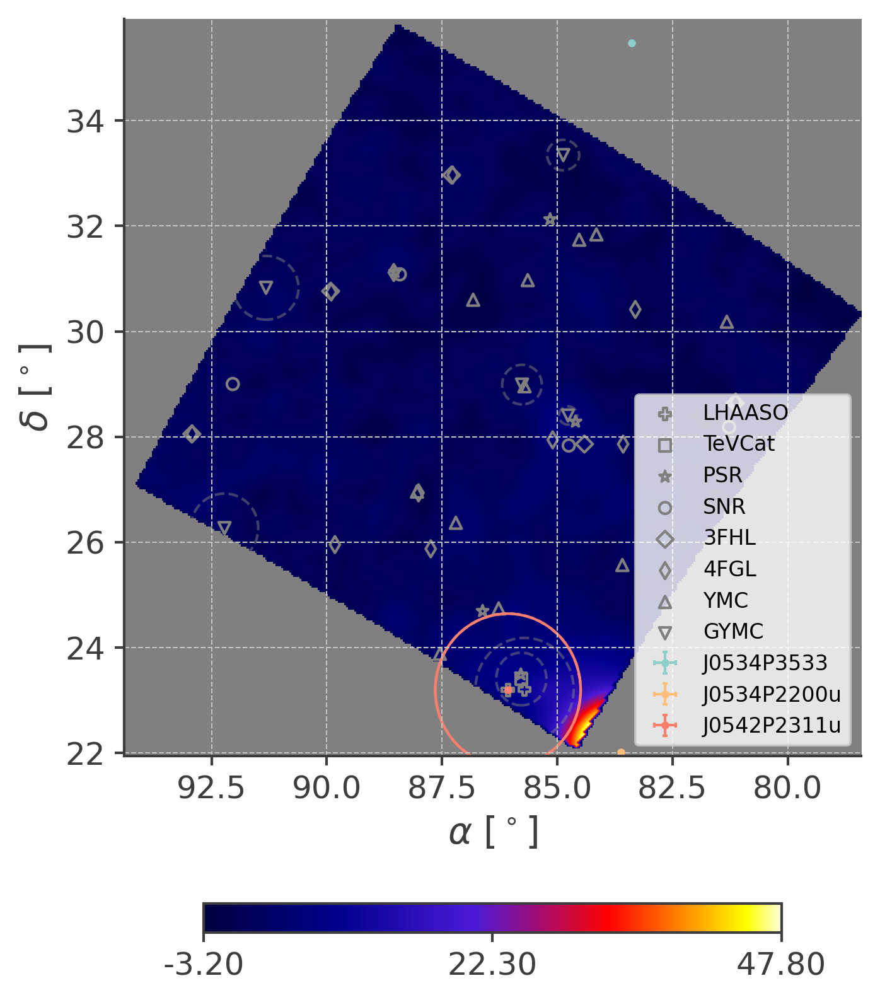

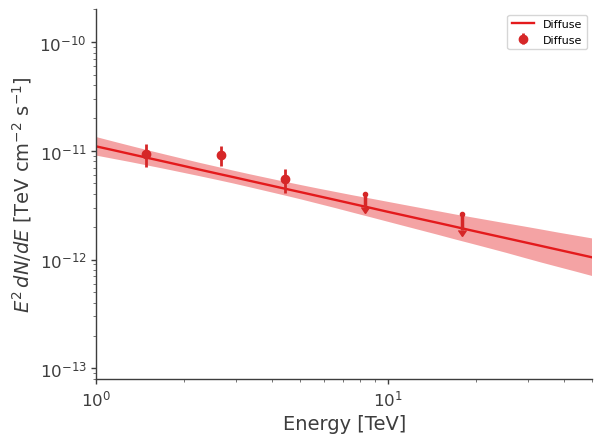

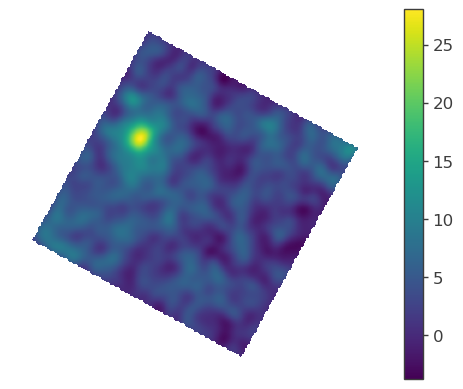

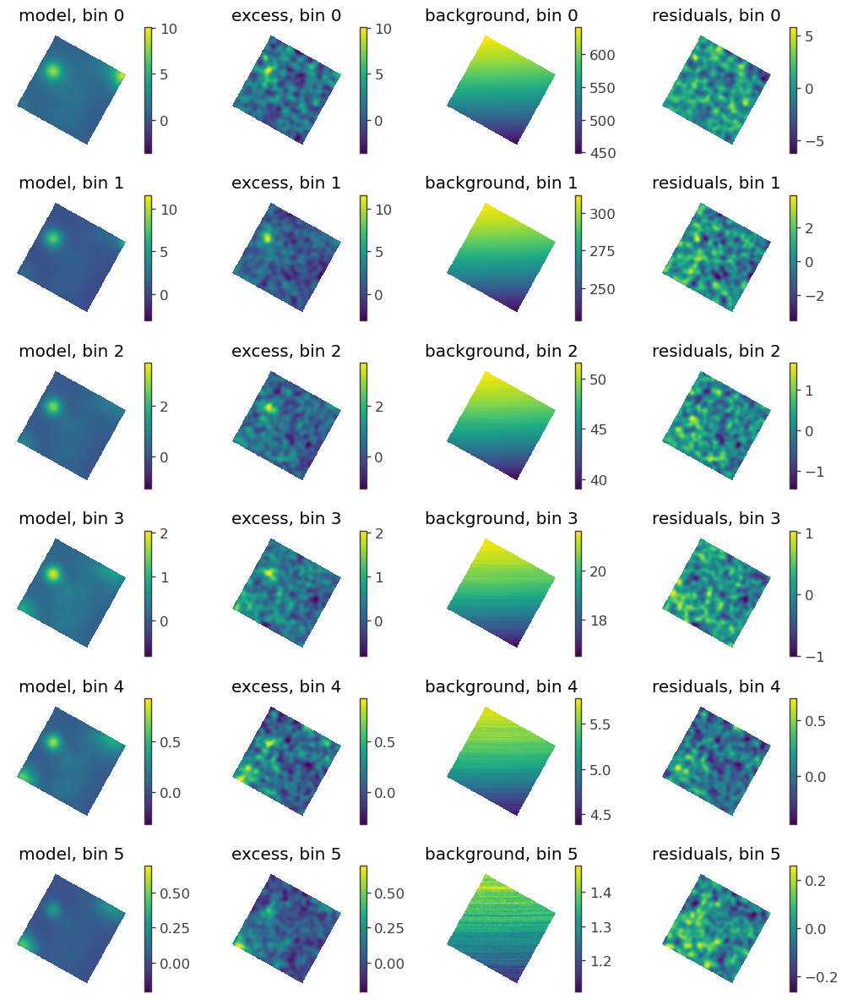

<Figure size 640x480 with 0 Axes>

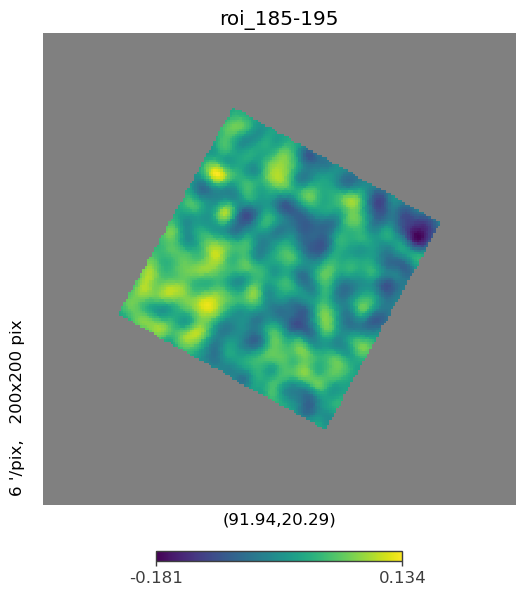

LHAASO:  1 85.71 23.2  1LHAASO J0542+2311u  0.98
LHAASO:  2 86.07 23.19  1LHAASO J0542+2311u   1.45
LHAASO:  3 94.35 22.57 1LHAASO J0617+2234  0.59
LHAASO:  4 98.57 17.69  1LHAASO J0634+1741u  0.89
LHAASO:  5 98.51 17.72  1LHAASO J0634+1741u   1.16
LHAASO:  6 98.29 16.79 1LHAASO J0633+1647 3.8669
TeVCat:  1 85.77999999999999 23.4 HAWC J0543+233 0.5
TeVCat:  2 94.21249999999999 22.503055555555555 IC 443 0.16
TeVCat:  3 97.69124999999998 18.68111111111111 3HWC J0630+186 0.0
TeVCat:  4 98.11666666666666 17.366666666666667 Geminga 2.6
TeVCat:  5 98.44249999999998 19.113611111111112 3HWC J0633+191 0.0
TeVCat:  6 98.52083333333331 17.803611111111113 Geminga Pulsar 0.0
PSR:  1 85.79025 23.484722222222224 J0543+2329
PSR:  2 86.61983333333332 24.689166666666665 J0546+2441
PSR:  3 89.38104166666666 15.835 J0557+1550
PSR:  4 92.495375 21.500777777777778 J0609+2130
PSR:  5 93.57149999999999 22.51 J0614+2229
PSR:  6 95.24999999999999 25.0 J0621+25
PSR:  7 96.80416666666666 16.2 J0627+16
PSR:  8 97.

Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(10.0 +/- 1.9) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1448.550812
total,1448.550812


Values of statistical measures:

,statistical measures
AIC,2899.101645
BIC,2909.217520


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(1.37 +/- 0.16) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1467.636261
total,1467.636261


Values of statistical measures:

,statistical measures
AIC,2937.272544
BIC,2947.388418


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(1.50 +/- 0.18) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1429.828242
total,1429.828242


Values of statistical measures:

,statistical measures
AIC,2861.656507
BIC,2871.772381


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(1.33 +/- 0.16) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1476.29341
total,1476.29341


Values of statistical measures:

,statistical measures
AIC,2954.586841
BIC,2964.702715


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(1.22 +/- 0.19) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1462.82179
total,1462.82179


Values of statistical measures:

,statistical measures
AIC,2927.643601
BIC,2937.759475


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(1.10 +/- 0.21) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1386.443637
total,1386.443637


Values of statistical measures:

,statistical measures
AIC,2774.887296
BIC,2785.003170


100%|██████████| 6/6 [01:40<00:00, 16.67s/it]


processing MLE analyses:   0%|          | 0/1 [00:00<?, ?it/s]

Propagating errors:   0%|          | 0/30 [00:00<?, ?it/s]


WARNING UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go" (-> color='g'). The keyword argument will take precedence.



14:36:32 INFO      Region of Interest:                                                                   ]8;id=183219;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=178867;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#292\292]8;;\

         INFO      -------------------                                                                   ]8;id=318961;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=420793;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#293\293]8;;\

         INFO      HealpixMapROI: Center (R.A., Dec) = (96.882, 11.489), model radius: 9.000 ]8;id=11099;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/region_of_interest/healpix_map_roi.py\healpix_map_roi.py]8;;\:]8;id=713695;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/region_of_interest/healpix_map_roi.py#134\134]8;;\
                  deg, display radius: 7.000 deg, threshold = 0.50                                                 

         INFO                                                                                            ]8;id=453513;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=136831;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#296\296]8;;\

         INFO      Flat sky projection:                                                                  ]8;id=713319;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=645683;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#297\297]8;;\

         INFO      --------------------                                                                  ]8;id=697464;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=18372;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#298\298]8;;\

         INFO      Width x height 106 x 106 px                                                           ]8;id=913515;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=447116;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#300\300]8;;\

         INFO      Pixel sizes: 0.17 deg                                                                 ]8;id=53550;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=775113;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#305\305]8;;\

         INFO                                                                                            ]8;id=433922;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=844009;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#308\308]8;;\

         INFO      Response:                                                                             ]8;id=780278;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=805230;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#309\309]8;;\

         INFO      ---------                                                                             ]8;id=919578;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=342054;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#310\310]8;;\

         INFO      Response file:                                                                   ]8;id=473364;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=290502;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#340\340]8;;\
                  /data/home/cwy/Science/3MLWCDA/Standard/src/../../data/DR_ihep_MK2_newoldDRpsf.ro                
                  ot                                                                                               

         INFO      Number of dec bins: 110                                                          ]8;id=158328;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=402354;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#341\341]8;;\

         INFO      Number of energy/nHit planes per dec bin_name: 6                                 ]8;id=328544;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=992230;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#344\344]8;;\

         INFO                                                                                            ]8;id=745403;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=131104;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#314\314]8;;\

         INFO      Map Tree:                                                                             ]8;id=188209;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=369153;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#315\315]8;;\

         INFO      ----------                                                                            ]8;id=68385;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=456550;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#316\316]8;;\

,Bin,Nside,Scheme,Obs counts,Bkg counts,obs/bkg,Pixels in ROI,Area (deg^2)
0,0,1024,RING,1.257243e+07,1.255719e+07,1.001214,30460,99.86283
1,1,1024,RING,6.445785e+06,6.411579e+06,1.005335,30460,99.86283
2,2,1024,RING,1.113248e+06,1.102947e+06,1.009340,30460,99.86283
3,3,1024,RING,4.790716e+05,4.682341e+05,1.023145,30460,99.86283
4,4,1024,RING,1.294916e+05,1.244684e+05,1.040357,30460,99.86283
5,5,1024,RING,3.502186e+04,3.231142e+04,1.083885,30460,99.86283


         INFO      This Map Tree contains 795.961 transits in the first bin                         ]8;id=251869;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py\map_tree.py]8;;\:]8;id=264512;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py#149\149]8;;\

         INFO      Total data size: 2.92 Mb                                                         ]8;id=146709;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py\map_tree.py]8;;\:]8;id=590026;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py#151\151]8;;\

         INFO                                                                                            ]8;id=753935;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=844340;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#320\320]8;;\

         INFO      Active energy/nHit planes (6):                                                        ]8;id=25086;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=579046;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#322\322]8;;\

         INFO      -------------------------------                                                       ]8;id=341128;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=400054;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#323\323]8;;\

         INFO      ['0', '1', '2', '3', '4', '5']                                                        ]8;id=450650;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=814570;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#324\324]8;;\

14:36:33 INFO      Set WCDA tansit from: 795.9613310185185 to 796.2928263888889                         ]8;id=387967;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Mymap.py\Mymap.py]8;;\:]8;id=715289;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Mymap.py#41\41]8;;\

14:36:34 INFO      J0634P1741u in roi: 7 sf:True pf:True kf:False indexf:False                         ]8;id=380270;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=682322;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#322\322]8;;\

         INFO      Spec:                                                                               ]8;id=36926;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=888151;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#350\350]8;;\
                   K=1.53e-13 kb=(1.53e-15, 1.45e-12) index=-1.65 indexb=(-3.15,-1.00)                             

         INFO      Mor:                                                                                ]8;id=525271;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=337689;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#352\352]8;;\
                   sigma=1.16 sb=(0.00,2.52) fitrange=2.24                                                         

         INFO      J0633P1647 in roi: 7 sf:True pf:True kf:False indexf:False                          ]8;id=521494;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=726338;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#322\322]8;;\

         INFO      Spec:                                                                               ]8;id=830098;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=579873;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#350\350]8;;\
                   K=3.17e-13 kb=(3.17e-15, 7.61e-13) index=-2.21 indexb=(-2.66,-1.76)                             

         INFO      Mor:                                                                                ]8;id=891350;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=404350;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#352\352]8;;\
                   sigma=5.96 sb=(3.55,8.38) fitrange=3.04                                                         

         INFO      J0703P1405 in model_radius: 9 sf:True pf:True kf:True indexf:True                   ]8;id=805400;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=360202;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#329\329]8;;\

         INFO      Spec:                                                                               ]8;id=917907;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=891849;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#350\350]8;;\
                   K=2.27e-13 kb=(2.27e-15, 1.71e-12) index=-1.98 indexb=(-3.18,-1.00)                             

         INFO      Mor:                                                                                ]8;id=452827;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=528278;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#352\352]8;;\
                   sigma=1.30 sb=(0.00,2.98) fitrange=3.84                                                         

         INFO      Set diffuse range: [192.0, 208.0] [-8, 8]                                          ]8;id=549467;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=767645;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1215\1215]8;;\

         INFO      ra dec coner:                                                                      ]8;id=190355;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=279681;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1216\1216]8;;\

         INFO      (85.72327589450565, 14.560418753216078)                                            ]8;id=391691;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=13355;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1217\1217]8;;\

         INFO      (93.49611431789383, 0.705260604672708)                                             ]8;id=652760;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=432254;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1218\1218]8;;\

         INFO      (107.78602111376306, 8.003302048511818)                                            ]8;id=283360;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=721718;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1219\1219]8;;\

         INFO      (100.54043810079837, 22.229791117803074)                                           ]8;id=367270;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=180846;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1220\1220]8;;\

         INFO      total sr: 0.07772890321151499                                                      ]8;id=393269;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=395318;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1259\1259]8;;\
                  ratio: 0.028307125215400412                                                                      

         INFO      integration: 3.717254761882161e-06                                                 ]8;id=644260;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=782987;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1260\1260]8;;\
                  ratio: 0.029334928403948583                                                                      

         INFO      set K to: 5.259630863028671e-13                                                    ]8;id=390614;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=873894;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1261\1261]8;;\

         INFO      diffuse file path: ../../data/Diffuse_WCDA_case14_dust_bkg_template.fits           ]8;id=409022;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=882442;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1288\1288]8;;\

Model summary:
==============

                  N
Point sources     0
Extended sources  4
Particle sources  0

Free parameters (6):
--------------------

                                            value min_value max_value   
J0634P1741u.spectrum.main.Powerlaw.K          0.0       0.0       0.0  \
J0634P1741u.spectrum.main.Powerlaw.index    -1.65     -3.15      -1.0   
J0633P1647.spectrum.main.Powerlaw.K           0.0       0.0       0.0   
J0633P1647.spectrum.main.Powerlaw.index  -2.20641  -2.65501  -1.75781   
Diffuse.spectrum.main.Powerlaw.K              0.0       0.0       0.0   
Diffuse.spectrum.main.Powerlaw.index         -2.5      -4.5      -0.5   

                                                    unit  
J0634P1741u.spectrum.main.Powerlaw.K      keV-1 s-1 cm-2  
J0634P1741u.spectrum.main.Powerlaw.index                  
J0633P1647.spectrum.main.Powerlaw.K       keV-1 s-1 cm-2  
J0633P1647.spectrum.main.Powerlaw.index                   
Diffuse.spectrum.main.Powerlaw.K          keV-1 s-1 cm-2  
Diffuse.spectrum.main.Powerlaw.index                      

Fixed parameters (18):
---------------------

                                                                                     value   
J0634P1741u.Gaussian_on_sphere.lon0                                                  98.51  \
J0634P1741u.Gaussian_on_sphere.lat0                                                  17.72   
J0634P1741u.Gaussian_on_sphere.sigma                                                  1.16   
J0634P1741u.spectrum.main.Powerlaw.piv                                        3000000000.0   
J0633P1647.Gaussian_on_sphere.lon0                                                 100.277   
J0633P1647.Gaussian_on_sphere.lat0                                                  15.328   
J0633P1647.Gaussian_on_sphere.sigma                                                5.96239   
J0633P1647.spectrum.main.Powerlaw.piv                                         3000000000.0   
J0703P1405.Gaussian_on_sphere.lon0                                                  105.32   
J0703P1405.Gaussian_on_sphere.lat0                                                   14.55   
J0703P1405.Gaussian_on_sphere.sigma                                                    1.3   
J0703P1405.spectrum.main.Powerlaw.K                                                    0.0   
J0703P1405.spectrum.main.Powerlaw.piv                                         3000000000.0   
J0703P1405.spectrum.main.Powerlaw.index                                              -1.98   
Diffuse.SpatialTemplate_2D.K                                                           1.0   
Diffuse.SpatialTemplate_2D.hash          7576476867247659005403163432081990073733417753...   
Diffuse.SpatialTemplate_2D.ihdu                                                        0.0   
Diffuse.spectrum.main.Powerlaw.piv                                            3000000000.0   

                                        min_value max_value            unit  
J0634P1741u.Gaussian_on_sphere.lon0         96.27    100.75             deg  
J0634P1741u.Gaussian_on_sphere.lat0         15.48     19.96             deg  
J0634P1741u.Gaussian_on_sphere.sigma          0.0      2.52             deg  
J0634P1741u.spectrum.main.Powerlaw.piv       None      None             keV  
J0633P1647.Gaussian_on_sphere.lon0         97.237   103.317             deg  
J0633P1647.Gaussian_on_sphere.lat0         12.288    18.368             deg  
J0633P1647.Gaussian_on_sphere.sigma       3.54871   8.37607             deg  
J0633P1647.spectrum.main.Powerlaw.piv        None      None             keV  
J0703P1405.Gaussian_on_sphere.lon0         101.48    109.16             deg  
J0703P1405.Gaussian_on_sphere.lat0          10.71     18.39             deg  
J0703P1405.Gaussian_on_sphere.sigma           0.0      2.98             deg  
J0703P1405.spectrum.main.Powerlaw.K           0.0       0.0  keV-1 s-1 cm-2  
J0703P1405.spectrum.main.Powerlaw.piv        None      None             

14:36:35 INFO      Considering 10 dec bins for extended source J0634P1741u          ]8;id=349450;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=211019;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 17.720                      ]8;id=473598;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=405856;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 20 dec bins for extended source J0633P1647           ]8;id=992597;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=923365;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 15.328                      ]8;id=532699;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=565641;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 14 dec bins for extended source J0703P1405           ]8;id=29279;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=830955;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 14.550                      ]8;id=518892;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=704622;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 20 dec bins for extended source Diffuse              ]8;id=437915;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=852256;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 11.424                      ]8;id=913771;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=545656;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      set the minimizer to minuit                                             ]8;id=31907;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py\joint_likelihood.py]8;;\:]8;id=301122;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py#1042\1042]8;;\

         INFO      set the minimizer to ROOT                                               ]8;id=53666;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py\joint_likelihood.py]8;;\:]8;id=153528;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py#1059\1059]8;;\

Best fit values:

,result,unit
parameter,,
J0634P1741u.spectrum.main.Powerlaw.K,(2.3 -0.8 +1.2) x 10^-22,1 / (keV s cm2)
J0634P1741u.spectrum.main.Powerlaw.index,-1.79 +/- 0.22,
J0633P1647.spectrum.main.Powerlaw.K,(7.61433 +/- 0.00024) x 10^-22,1 / (keV s cm2)
J0633P1647.spectrum.main.Powerlaw.index,-1.757810 +/- 0.000035,
Diffuse.spectrum.main.Powerlaw.K,(1.62 -0.12 +0.13) x 10^-21,1 / (keV s cm2)
Diffuse.spectrum.main.Powerlaw.index,-2.50 +/- 0.07,


Correlation matrix:

1.00,-0.99,-0.04,-0.05,-0.32,0.25
-0.99,1.00,0.04,0.05,0.30,-0.26
-0.04,0.04,1.00,0.00,0.01,-0.01
-0.05,0.05,0.00,1.00,0.02,-0.01
-0.32,0.30,0.01,0.02,1.00,-0.48
0.25,-0.26,-0.01,-0.01,-0.48,1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA,8281.428562
total,8281.428562


Values of statistical measures:

,statistical measures
AIC,16574.857583
BIC,16635.552698


14:37:16 WARNING   Parameter J0633P1647.spectrum.main.Powerlaw.K is close to the maximum value:        ]8;id=39813;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=150827;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#550\550]8;;\
                  -4.86e+01 < -4.86e+01                                                                            

         WARNING   Parameter J0633P1647.spectrum.main.Powerlaw.index is close to the maximum value:    ]8;id=890297;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=505574;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#550\550]8;;\
                  -1.76e+00 < -1.76e+00                                                                            

         INFO      Parameter J0633P1647.spectrum.main.Powerlaw.K is close to the boundary, extend the  ]8;id=316092;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=472437;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#655\655]8;;\
                  boundary to (3.1699300000000005e-24, 7.614330000000001e-21).                                     

         INFO      Parameter J0633P1647.spectrum.main.Powerlaw.index is close to the boundary, extend  ]8;id=979653;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=673796;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#655\655]8;;\
                  the boundary to (-2.65501, -0.8606100000000003).                                                 

14:37:17 INFO      Considering 10 dec bins for extended source J0634P1741u          ]8;id=625652;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=139727;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 17.720                      ]8;id=972749;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=807634;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 20 dec bins for extended source J0633P1647           ]8;id=975149;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=987450;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 15.328                      ]8;id=373048;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=873217;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 14 dec bins for extended source J0703P1405           ]8;id=120002;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=232866;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 14.550                      ]8;id=47688;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=9521;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 20 dec bins for extended source Diffuse              ]8;id=768796;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=431095;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 11.424                      ]8;id=300283;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=579140;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

14:37:18 INFO      Considering 10 dec bins for extended source J0634P1741u          ]8;id=22840;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=734083;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 17.720                      ]8;id=912796;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=897459;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 20 dec bins for extended source J0633P1647           ]8;id=227462;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=949645;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 15.328                      ]8;id=725267;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=394483;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 14 dec bins for extended source J0703P1405           ]8;id=318363;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=601453;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 14.550                      ]8;id=706384;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=408634;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 20 dec bins for extended source Diffuse              ]8;id=211616;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=280141;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 11.424                      ]8;id=661995;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=937756;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      set the minimizer to minuit                                             ]8;id=683881;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py\joint_likelihood.py]8;;\:]8;id=122725;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py#1042\1042]8;;\

         INFO      set the minimizer to ROOT                                               ]8;id=542041;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py\joint_likelihood.py]8;;\:]8;id=188802;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py#1059\1059]8;;\

Best fit values:

,result,unit
parameter,,
J0634P1741u.spectrum.main.Powerlaw.K,(1.6 -0.9 +1.9) x 10^-22,1 / (keV s cm2)
J0634P1741u.spectrum.main.Powerlaw.index,-1.7 +/- 0.4,
J0633P1647.spectrum.main.Powerlaw.K,(2.4 -0.6 +0.7) x 10^-21,1 / (keV s cm2)
J0633P1647.spectrum.main.Powerlaw.index,-2.09 +/- 0.13,
Diffuse.spectrum.main.Powerlaw.K,(8.5 -2.3 +3.1) x 10^-22,1 / (keV s cm2)
Diffuse.spectrum.main.Powerlaw.index,-2.55 +/- 0.16,


Correlation matrix:

1.00,-1.00,-0.68,0.68,0.46,-0.28
-1.00,1.00,0.66,-0.68,-0.44,0.28
-0.68,0.66,1.00,-0.92,-0.86,0.45
0.68,-0.68,-0.92,1.00,0.70,-0.61
0.46,-0.44,-0.86,0.70,1.00,-0.38
-0.28,0.28,0.45,-0.61,-0.38,1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA,8271.271567
total,8271.271567


Values of statistical measures:

,statistical measures
AIC,16554.543593
BIC,16615.238708


Smoothing planes:   0%|          | 0/6 [00:00<?, ?it/s]

Smoothing planes:   0%|          | 0/6 [00:00<?, ?it/s]

14:38:16 INFO      Considering 10 dec bins for extended source J0634P1741u          ]8;id=265733;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=76086;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 17.720                      ]8;id=782419;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=681297;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 20 dec bins for extended source J0633P1647           ]8;id=358594;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=299018;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 15.328                      ]8;id=128376;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=956047;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 14 dec bins for extended source J0703P1405           ]8;id=816566;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=303220;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 14.550                      ]8;id=300728;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=635002;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      Considering 20 dec bins for extended source Diffuse              ]8;id=399944;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=192855;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 11.424                      ]8;id=5069;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=958798;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\


WARNING RuntimeWarning: invalid value encountered in sqrt



(96.94335937499999, 11.757859073352591)


<Figure size 640x480 with 0 Axes>

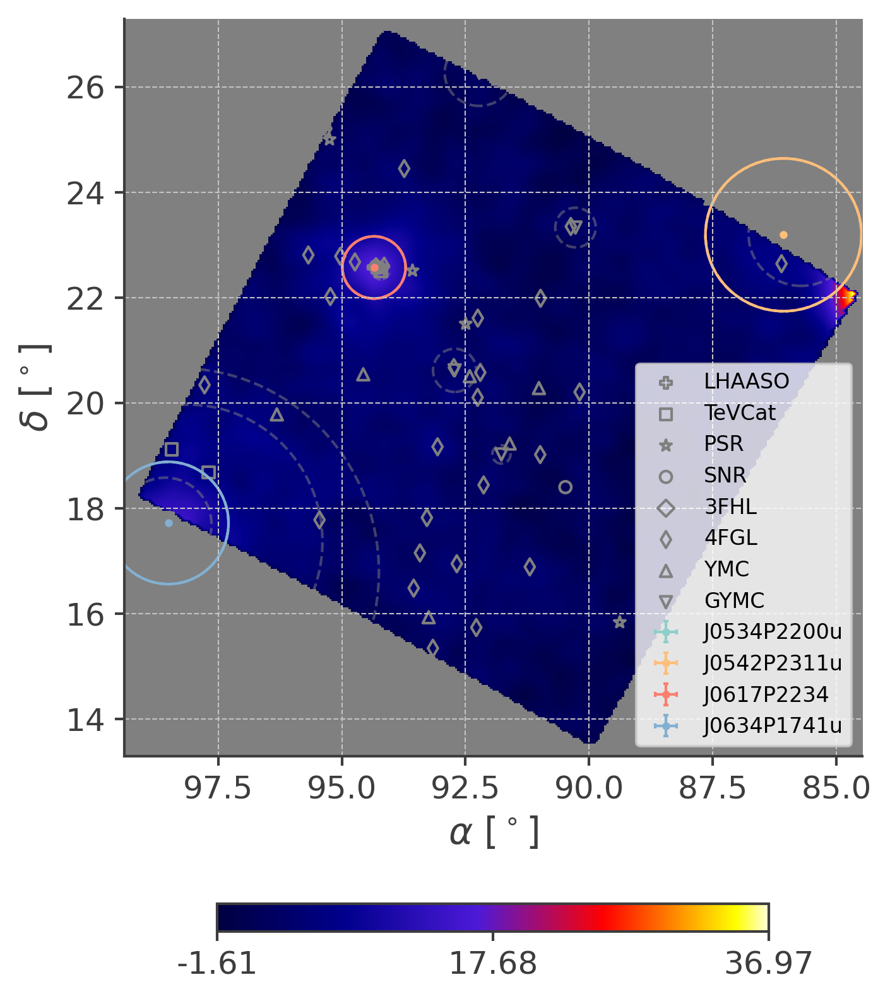

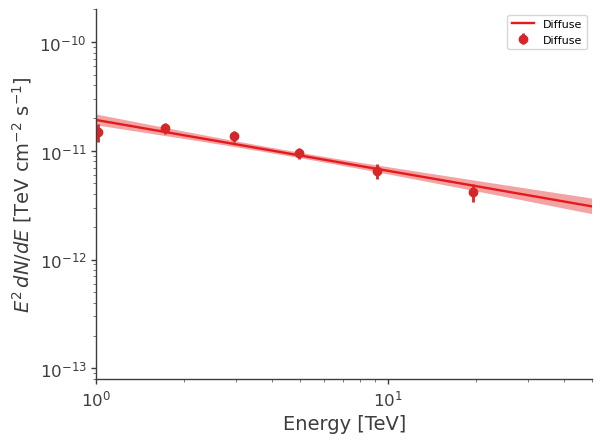

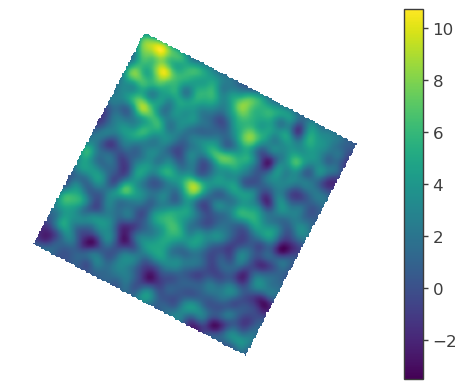

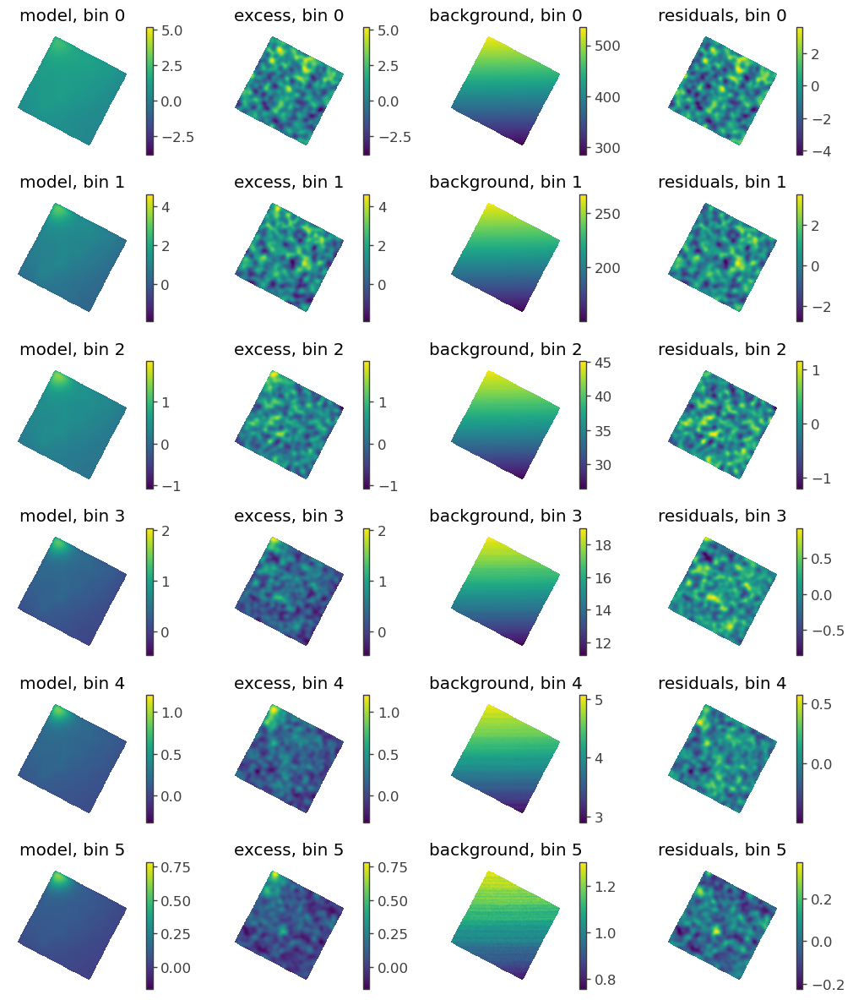

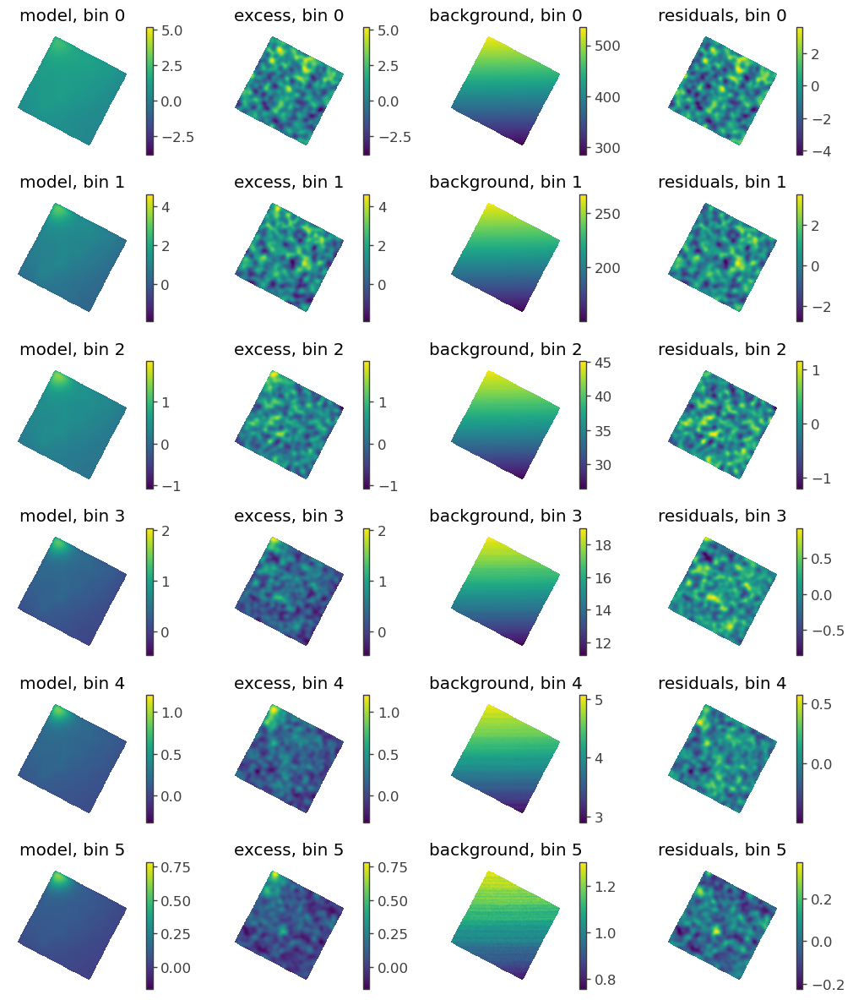

<Figure size 640x480 with 0 Axes>

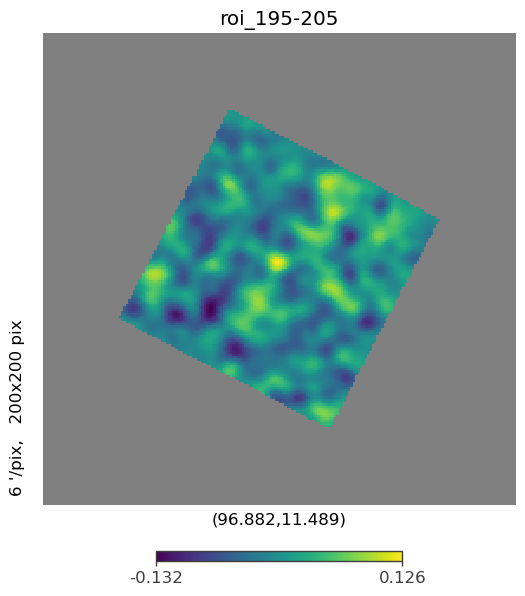

LHAASO:  1 97.77 10.67  1LHAASO J0631+1040  0.0
LHAASO:  2 97.77 10.67  1KM2A J0631+1040  0
LHAASO:  3 98.57 17.69  1LHAASO J0634+1741u  0.89
LHAASO:  4 98.51 17.72  1LHAASO J0634+1741u   1.16
LHAASO:  5 98.76 6.33  1LHAASO J0635+0619  0.6
LHAASO:  6 98.76 6.33  1KM2A J0635+0619  0
LHAASO:  7 100.277 15.328  1LHAASO J0633+1647 5.96239
LHAASO:  8 98.29 16.79 1LHAASO J0633+1647 3.8669
TeVCat:  1 97.78083333333332 10.731388888888889 3HWC J0631+107 0.0
TeVCat:  2 97.95508333333332 10.570194444444445 0FGL J0631.8+1034 0.0
TeVCat:  3 98.11666666666666 17.366666666666667 Geminga 2.6
TeVCat:  4 98.25333333333332 5.7941666666666665 HESS J0632+057 0.0
TeVCat:  5 98.52083333333331 17.803611111111113 Geminga Pulsar 0.0
TeVCat:  6 98.71 7.0 HAWC J0635+070 0.65
TeVCat:  7 102.19 15.270000000000001 RX J0648.7+1516 0.0
PSR:  1 95.34212499999998 10.044083333333333 J0621+1002
PSR:  2 96.4375 10.266666666666667 J0625+10
PSR:  3 96.80416666666666 16.2 J0627+16
PSR:  4 96.93404166666666 7.109249999999999 J

Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(-0.0 +/- 2.5) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1225.522309
total,1225.522309


Values of statistical measures:

,statistical measures
AIC,2453.044639
BIC,2463.160546


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(1.48 +/- 0.22) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1461.660838
total,1461.660838


Values of statistical measures:

,statistical measures
AIC,2925.321697
BIC,2935.437605


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(6.9 +/- 2.7) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1361.424462
total,1361.424462


Values of statistical measures:

,statistical measures
AIC,2724.848945
BIC,2734.964852


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(1.41 +/- 0.24) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1437.132989
total,1437.132989


Values of statistical measures:

,statistical measures
AIC,2876.266000
BIC,2886.381907


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(7.6 +/- 2.9) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1382.240219
total,1382.240219


Values of statistical measures:

,statistical measures
AIC,2766.480460
BIC,2776.596367


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(1.3 +/- 3.3) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1387.383164
total,1387.383164


Values of statistical measures:

,statistical measures
AIC,2776.766351
BIC,2786.882258



100%|██████████| 6/6 [01:51<00:00, 18.62s/it]


processing MLE analyses:   0%|          | 0/1 [00:00<?, ?it/s]

Propagating errors:   0%|          | 0/30 [00:00<?, ?it/s]


WARNING UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go" (-> color='g'). The keyword argument will take precedence.



14:41:33 INFO      Region of Interest:                                                                   ]8;id=625533;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=108129;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#292\292]8;;\

         INFO      -------------------                                                                   ]8;id=131592;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=291170;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#293\293]8;;\

         INFO      HealpixMapROI: Center (R.A., Dec) = (101.522, 2.609), model radius: 9.000 ]8;id=705340;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/region_of_interest/healpix_map_roi.py\healpix_map_roi.py]8;;\:]8;id=52925;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/region_of_interest/healpix_map_roi.py#134\134]8;;\
                  deg, display radius: 7.000 deg, threshold = 0.50                                                 

         INFO                                                                                            ]8;id=702555;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=786831;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#296\296]8;;\

         INFO      Flat sky projection:                                                                  ]8;id=769342;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=53589;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#297\297]8;;\

         INFO      --------------------                                                                  ]8;id=719913;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=539698;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#298\298]8;;\

         INFO      Width x height 106 x 106 px                                                           ]8;id=352533;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=774272;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#300\300]8;;\

         INFO      Pixel sizes: 0.17 deg                                                                 ]8;id=901556;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=336345;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#305\305]8;;\

         INFO                                                                                            ]8;id=852379;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=39566;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#308\308]8;;\

         INFO      Response:                                                                             ]8;id=526770;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=792576;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#309\309]8;;\

         INFO      ---------                                                                             ]8;id=633731;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=788591;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#310\310]8;;\

         INFO      Response file:                                                                   ]8;id=227681;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=906740;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#340\340]8;;\
                  /data/home/cwy/Science/3MLWCDA/Standard/src/../../data/DR_ihep_MK2_newoldDRpsf.ro                
                  ot                                                                                               

         INFO      Number of dec bins: 110                                                          ]8;id=451315;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=637171;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#341\341]8;;\

         INFO      Number of energy/nHit planes per dec bin_name: 6                                 ]8;id=872703;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=601454;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#344\344]8;;\

         INFO                                                                                            ]8;id=580416;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=809985;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#314\314]8;;\

         INFO      Map Tree:                                                                             ]8;id=79549;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=562932;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#315\315]8;;\

         INFO      ----------                                                                            ]8;id=187282;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=628507;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#316\316]8;;\

,Bin,Nside,Scheme,Obs counts,Bkg counts,obs/bkg,Pixels in ROI,Area (deg^2)
0,0,1024,RING,7.617790e+06,7.607311e+06,1.001378,30470,99.895615
1,1,1024,RING,4.035216e+06,4.028836e+06,1.001583,30470,99.895615
2,2,1024,RING,7.134470e+05,7.098645e+05,1.005047,30470,99.895615
3,3,1024,RING,3.024980e+05,2.998596e+05,1.008799,30470,99.895615
4,4,1024,RING,7.886701e+04,7.797464e+04,1.011444,30470,99.895615
5,5,1024,RING,2.127890e+04,2.104113e+04,1.011300,30470,99.895615


         INFO      This Map Tree contains 795.961 transits in the first bin                         ]8;id=671012;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py\map_tree.py]8;;\:]8;id=930874;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py#149\149]8;;\

         INFO      Total data size: 2.93 Mb                                                         ]8;id=293438;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py\map_tree.py]8;;\:]8;id=367637;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py#151\151]8;;\

         INFO                                                                                            ]8;id=375376;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=71658;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#320\320]8;;\

         INFO      Active energy/nHit planes (6):                                                        ]8;id=751362;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=299617;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#322\322]8;;\

         INFO      -------------------------------                                                       ]8;id=450377;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=474054;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#323\323]8;;\

         INFO      ['0', '1', '2', '3', '4', '5']                                                        ]8;id=968665;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=148614;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#324\324]8;;\

14:41:34 INFO      Set WCDA tansit from: 795.9613310185185 to 796.2928263888889                         ]8;id=20532;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Mymap.py\Mymap.py]8;;\:]8;id=36893;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Mymap.py#41\41]8;;\

14:41:35 INFO      Set diffuse range: [202.00000000000003, 218.00000000000003] [-8, 8]                ]8;id=522197;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=957993;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1215\1215]8;;\

         INFO      ra dec coner:                                                                      ]8;id=545669;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=637562;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1216\1216]8;;\

         INFO      (90.70021251634498, 5.950912756760395)                                             ]8;id=460973;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=714673;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1217\1217]8;;\

         INFO      (97.99355144551946, -8.124031298039858)                                            ]8;id=877424;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=554631;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1218\1218]8;;\

         INFO      (112.28518757068724, -0.8248068371651607)                                          ]8;id=940611;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=845439;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1219\1219]8;;\

         INFO      (105.11114486454846, 13.33226615285231)                                            ]8;id=556828;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=158186;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1220\1220]8;;\

14:41:36 INFO      total sr: 0.07772890321151499                                                      ]8;id=187039;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=555099;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1259\1259]8;;\
                  ratio: 0.028307125215400412                                                                      

         INFO      integration: 3.929349973244053e-06                                                 ]8;id=22283;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=901286;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1260\1260]8;;\
                  ratio: 0.03100868988619123                                                                       

         INFO      set K to: 5.559729347269971e-13                                                    ]8;id=716461;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=75008;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1261\1261]8;;\

         INFO      diffuse file path: ../../data/Diffuse_WCDA_case14_dust_bkg_template.fits           ]8;id=748559;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=493601;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1288\1288]8;;\

Model summary:
==============

                  N
Point sources     0
Extended sources  1
Particle sources  0

Free parameters (2):
--------------------

                                     value min_value max_value            unit
Diffuse.spectrum.main.Powerlaw.K       0.0       0.0       0.0  keV-1 s-1 cm-2
Diffuse.spectrum.main.Powerlaw.index  -2.5      -4.5      -0.5                

Fixed parameters (4):
---------------------

                                                                                value   
Diffuse.SpatialTemplate_2D.K                                                      1.0  \
Diffuse.SpatialTemplate_2D.hash     1092763370467755979530654163635198607265664622...   
Diffuse.SpatialTemplate_2D.ihdu                                                   0.0   
Diffuse.spectrum.main.Powerlaw.piv                                       3000000000.0   

                                   min_value max_value   unit  
Diffuse.SpatialTemplate_2D.K            None      None  deg-2  
Diffuse.SpatialTemplate_2D.hash         None      None         
Diffuse.SpatialTemplate_2D.ihdu          0.0      None         
Diffuse.spectrum.main.Powerlaw.piv      None      None    keV  

Properties (2):
--------------------

                                                                                  value   
Diffuse.SpatialTemplate_2D.fits_file  ../../data/Diffuse_WCDA_case14_dust_bkg_templa...  \
Diffuse.SpatialTemplate_2D.frame                                                   icrs   

                                                            allowed values  
Diffuse.SpatialTemplate_2D.fits_file                                  None  
Diffuse.SpatialTemplate_2D.frame      [icrs, galactic, fk5, fk4, fk4_no_e]  

Linked parameters (0):
----------------------

(none)

Independent variables:
----------------------

(none)

Linked functions (0):
----------------------

(none)

14:41:36 INFO      Considering 21 dec bins for extended source Diffuse              ]8;id=313069;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=500574;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 2.560                       ]8;id=934965;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=524259;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

14:41:37 INFO      set the minimizer to minuit                                             ]8;id=651232;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py\joint_likelihood.py]8;;\:]8;id=265160;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py#1042\1042]8;;\

         INFO      set the minimizer to ROOT                                               ]8;id=895379;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py\joint_likelihood.py]8;;\:]8;id=638592;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py#1059\1059]8;;\

Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.Powerlaw.K,(1.12 -0.14 +0.16) x 10^-21,1 / (keV s cm2)
Diffuse.spectrum.main.Powerlaw.index,-2.66 +/- 0.12,


Correlation matrix:

1.00,-0.45
-0.45,1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA,6931.923332
total,6931.923332


Values of statistical measures:

,statistical measures
AIC,13867.846730
BIC,13888.079179


Smoothing planes:   0%|          | 0/6 [00:00<?, ?it/s]

14:41:48 INFO      Considering 21 dec bins for extended source Diffuse              ]8;id=300498;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=693949;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = 2.560                       ]8;id=275424;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=967322;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\


WARNING RuntimeWarning: invalid value encountered in sqrt



(98.26171875, 6.016664062525166)


<Figure size 640x480 with 0 Axes>

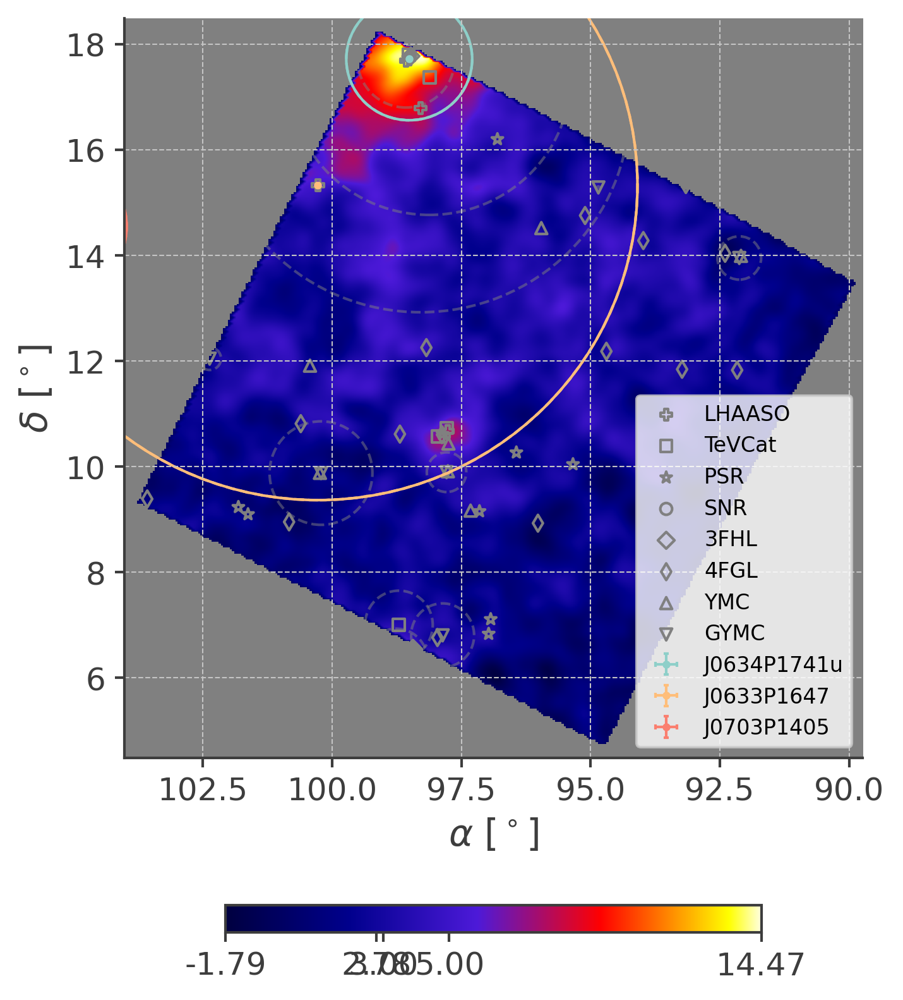

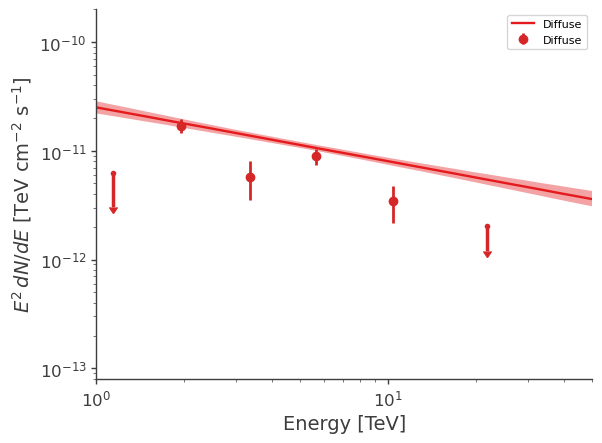

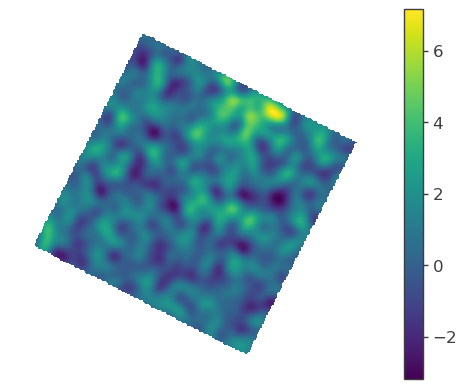

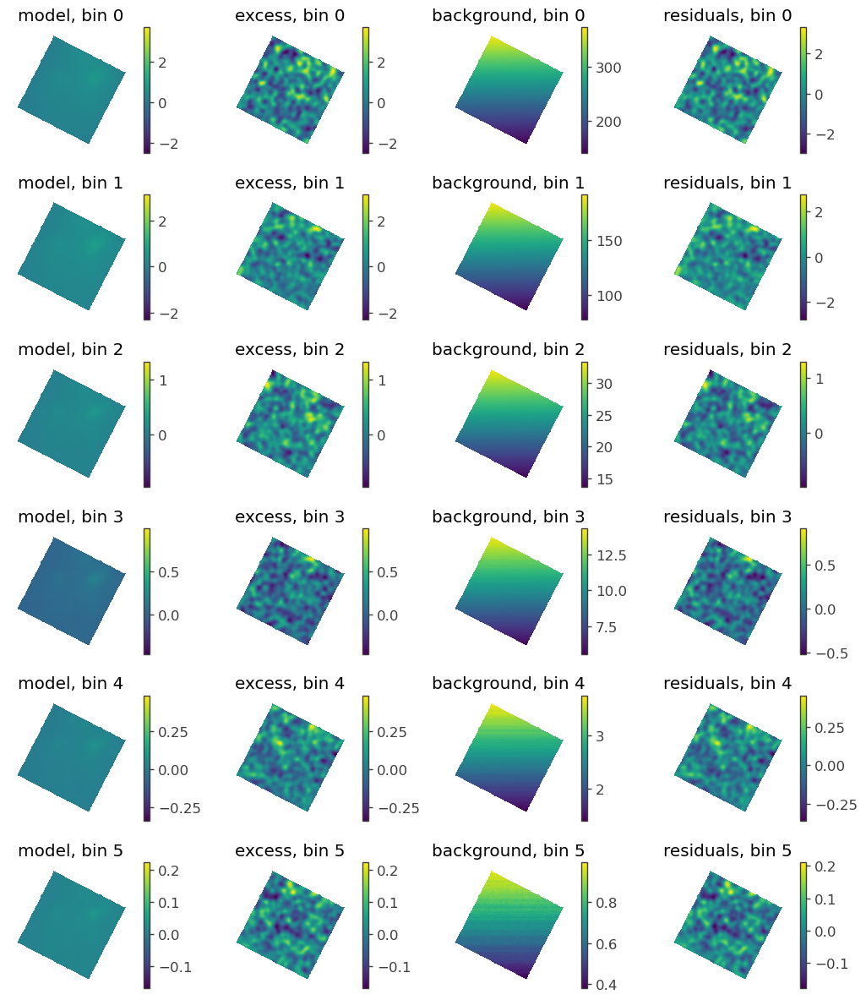

<Figure size 640x480 with 0 Axes>

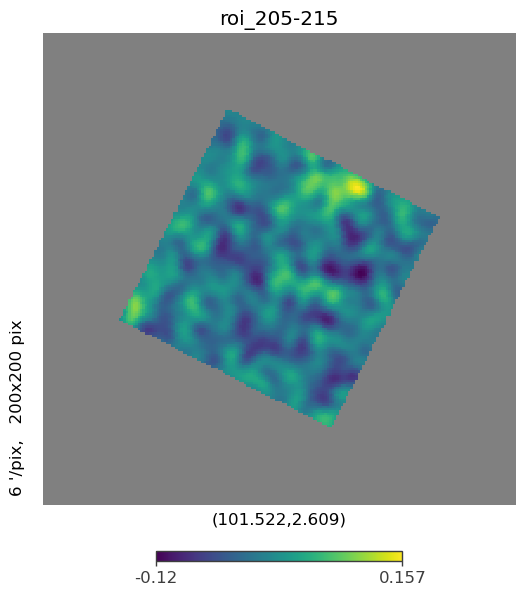

LHAASO:  1 98.76 6.33  1LHAASO J0635+0619  0.6
LHAASO:  2 98.76 6.33  1KM2A J0635+0619  0
TeVCat:  1 98.25333333333332 5.7941666666666665 HESS J0632+057 0.0
TeVCat:  2 98.71 7.0 HAWC J0635+070 0.65
PSR:  1 95.29674999999999 3.612638888888889 J0621+0336
PSR:  2 95.94483333333332 3.6685555555555553 J0623+0340
PSR:  3 96.93404166666666 7.109249999999999 J0627+0706
PSR:  4 96.97345833333333 6.8316944444444445 J0627+0649
PSR:  5 97.15074999999999 9.153861111111112 J0628+0909
PSR:  6 97.61233333333332 -0.7682777777777778 J0630-0046
PSR:  7 98.43420833333332 6.543027777777778 J0633+0632
PSR:  8 98.82499999999999 5.553055555555555 J0635+0533
PSR:  9 101.62912499999999 9.097027777777779 J0646+0905
PSR:  10 101.81533333333333 9.233194444444445 J0647+0913
PSR:  11 103.04629166666666 -1.7084166666666667 J0652-0142
PSR:  12 104.563375 0.3764722222222222 J0658+0022
PSR:  13 107.90074999999999 9.523611111111112 J0711+0931
SNR:  1 99.75 6.5 G205.5+00.5
SNR:  2 102.16666666666666 6.433333333333334 G206

Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(1.13 +/- 0.28) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1185.304403
total,1185.304403


Values of statistical measures:

,statistical measures
AIC,2372.608829
BIC,2382.725064


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(6.6 +/- 2.6) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1136.615665
total,1136.615665


Values of statistical measures:

,statistical measures
AIC,2275.231352
BIC,2285.347587


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(1.68 +/- 0.34) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1204.27773
total,1204.27773


Values of statistical measures:

,statistical measures
AIC,2410.555482
BIC,2420.671718


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(1.47 +/- 0.33) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1182.508624
total,1182.508624


Values of statistical measures:

,statistical measures
AIC,2367.017270
BIC,2377.133506


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(1.2 +/- 0.4) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1137.551846
total,1137.551846


Values of statistical measures:

,statistical measures
AIC,2277.103715
BIC,2287.219950


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(7 +/- 4) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1081.810001
total,1081.810001


Values of statistical measures:

,statistical measures
AIC,2165.620025
BIC,2175.736260



100%|██████████| 6/6 [01:21<00:00, 13.59s/it]


processing MLE analyses:   0%|          | 0/1 [00:00<?, ?it/s]

Propagating errors:   0%|          | 0/30 [00:00<?, ?it/s]


WARNING UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go" (-> color='g'). The keyword argument will take precedence.



14:44:32 INFO      Region of Interest:                                                                   ]8;id=105414;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=903124;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#292\292]8;;\

         INFO      -------------------                                                                   ]8;id=210143;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=185835;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#293\293]8;;\

         INFO      HealpixMapROI: Center (R.A., Dec) = (106.095, -6.287), model radius:      ]8;id=405651;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/region_of_interest/healpix_map_roi.py\healpix_map_roi.py]8;;\:]8;id=415287;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/region_of_interest/healpix_map_roi.py#134\134]8;;\
                  9.000 deg, display radius: 7.000 deg, threshold = 0.50                                           

         INFO                                                                                            ]8;id=917829;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=89529;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#296\296]8;;\

         INFO      Flat sky projection:                                                                  ]8;id=400983;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=82466;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#297\297]8;;\

         INFO      --------------------                                                                  ]8;id=486828;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=746707;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#298\298]8;;\

         INFO      Width x height 106 x 106 px                                                           ]8;id=848766;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=154098;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#300\300]8;;\

         INFO      Pixel sizes: 0.17 deg                                                                 ]8;id=868271;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=883642;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#305\305]8;;\

         INFO                                                                                            ]8;id=796113;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=198280;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#308\308]8;;\

         INFO      Response:                                                                             ]8;id=57374;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=977412;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#309\309]8;;\

         INFO      ---------                                                                             ]8;id=141753;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=217993;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#310\310]8;;\

         INFO      Response file:                                                                   ]8;id=507220;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=785967;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#340\340]8;;\
                  /data/home/cwy/Science/3MLWCDA/Standard/src/../../data/DR_ihep_MK2_newoldDRpsf.ro                
                  ot                                                                                               

         INFO      Number of dec bins: 110                                                          ]8;id=859027;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=854673;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#341\341]8;;\

         INFO      Number of energy/nHit planes per dec bin_name: 6                                 ]8;id=431521;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=624955;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#344\344]8;;\

         INFO                                                                                            ]8;id=298218;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=600229;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#314\314]8;;\

         INFO      Map Tree:                                                                             ]8;id=762355;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=44614;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#315\315]8;;\

         INFO      ----------                                                                            ]8;id=670986;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=883060;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#316\316]8;;\

,Bin,Nside,Scheme,Obs counts,Bkg counts,obs/bkg,Pixels in ROI,Area (deg^2)
0,0,1024,RING,3.510473e+06,3.507909e+06,1.000731,30462,99.869387
1,1,1024,RING,1.921921e+06,1.920405e+06,1.000790,30462,99.869387
2,2,1024,RING,3.413497e+05,3.403841e+05,1.002837,30462,99.869387
3,3,1024,RING,1.387721e+05,1.384773e+05,1.002129,30462,99.869387
4,4,1024,RING,3.396820e+04,3.373255e+04,1.006986,30462,99.869387
5,5,1024,RING,9.484309e+03,9.409513e+03,1.007949,30462,99.869387


         INFO      This Map Tree contains 795.961 transits in the first bin                         ]8;id=243602;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py\map_tree.py]8;;\:]8;id=382270;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py#149\149]8;;\

         INFO      Total data size: 2.92 Mb                                                         ]8;id=108776;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py\map_tree.py]8;;\:]8;id=8114;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py#151\151]8;;\

         INFO                                                                                            ]8;id=244564;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=917117;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#320\320]8;;\

         INFO      Active energy/nHit planes (6):                                                        ]8;id=205673;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=224949;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#322\322]8;;\

         INFO      -------------------------------                                                       ]8;id=228156;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=272030;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#323\323]8;;\

         INFO      ['0', '1', '2', '3', '4', '5']                                                        ]8;id=808256;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=73169;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#324\324]8;;\

14:44:33 INFO      Set WCDA tansit from: 795.9613310185185 to 796.2928263888889                         ]8;id=529425;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Mymap.py\Mymap.py]8;;\:]8;id=700618;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Mymap.py#41\41]8;;\

14:44:34 INFO      Set diffuse range: [211.99999999999997, 227.99999999999997] [-8, 8]                ]8;id=432135;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=857369;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1215\1215]8;;\

         INFO      ra dec coner:                                                                      ]8;id=244006;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=584603;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1216\1216]8;;\

         INFO      (95.3109909197462, -2.8158681612085763)                                            ]8;id=281466;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=440581;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1217\1217]8;;\

         INFO      (102.47147772717264, -17.012247758993414)                                          ]8;id=855265;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=294148;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1218\1218]8;;\

         INFO      (117.01939562216982, -9.535272830870591)                                           ]8;id=63961;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=564353;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1219\1219]8;;\

         INFO      (109.571114573899, 4.461831948352744)                                              ]8;id=511354;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=412085;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1220\1220]8;;\

         INFO      total sr: 0.07772890321151499                                                      ]8;id=981872;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=120362;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1259\1259]8;;\
                  ratio: 0.028307125215400412                                                                      

         INFO      integration: 3.6690256504849903e-06                                                ]8;id=657571;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=226276;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1260\1260]8;;\
                  ratio: 0.028954325614941538                                                                      

         INFO      set K to: 5.191390363237752e-13                                                    ]8;id=313371;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=13420;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1261\1261]8;;\

         INFO      diffuse file path: ../../data/Diffuse_WCDA_case14_dust_bkg_template.fits           ]8;id=888591;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=830851;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1288\1288]8;;\

Model summary:
==============

                  N
Point sources     0
Extended sources  1
Particle sources  0

Free parameters (2):
--------------------

                                     value min_value max_value            unit
Diffuse.spectrum.main.Powerlaw.K       0.0       0.0       0.0  keV-1 s-1 cm-2
Diffuse.spectrum.main.Powerlaw.index  -2.5      -4.5      -0.5                

Fixed parameters (4):
---------------------

                                                                                value   
Diffuse.SpatialTemplate_2D.K                                                      1.0  \
Diffuse.SpatialTemplate_2D.hash     7968285868664251682560562322668721246155104271...   
Diffuse.SpatialTemplate_2D.ihdu                                                   0.0   
Diffuse.spectrum.main.Powerlaw.piv                                       3000000000.0   

                                   min_value max_value   unit  
Diffuse.SpatialTemplate_2D.K            None      None  deg-2  
Diffuse.SpatialTemplate_2D.hash         None      None         
Diffuse.SpatialTemplate_2D.ihdu          0.0      None         
Diffuse.spectrum.main.Powerlaw.piv      None      None    keV  

Properties (2):
--------------------

                                                                                  value   
Diffuse.SpatialTemplate_2D.fits_file  ../../data/Diffuse_WCDA_case14_dust_bkg_templa...  \
Diffuse.SpatialTemplate_2D.frame                                                   icrs   

                                                            allowed values  
Diffuse.SpatialTemplate_2D.fits_file                                  None  
Diffuse.SpatialTemplate_2D.frame      [icrs, galactic, fk5, fk4, fk4_no_e]  

Linked parameters (0):
----------------------

(none)

Independent variables:
----------------------

(none)

Linked functions (0):
----------------------

(none)

14:44:35 INFO      Considering 21 dec bins for extended source Diffuse              ]8;id=732463;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=232867;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = -6.319                      ]8;id=850051;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=40659;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      set the minimizer to minuit                                             ]8;id=79271;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py\joint_likelihood.py]8;;\:]8;id=375895;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py#1042\1042]8;;\

         INFO      set the minimizer to ROOT                                               ]8;id=889048;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py\joint_likelihood.py]8;;\:]8;id=596537;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py#1059\1059]8;;\

Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.Powerlaw.K,(7.6 -2.6 +4) x 10^-22,1 / (keV s cm2)
Diffuse.spectrum.main.Powerlaw.index,-2.9 +/- 0.5,


Correlation matrix:

1.00,-0.57
-0.57,1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA,6514.940104
total,6514.940104


Values of statistical measures:

,statistical measures
AIC,13033.880273
BIC,13054.112197


Smoothing planes:   0%|          | 0/6 [00:00<?, ?it/s]

14:44:46 INFO      Considering 21 dec bins for extended source Diffuse              ]8;id=93907;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=257694;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = -6.319                      ]8;id=72672;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=988138;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\


WARNING RuntimeWarning: invalid value encountered in sqrt



(108.720703125, -5.866650359896198)


<Figure size 640x480 with 0 Axes>

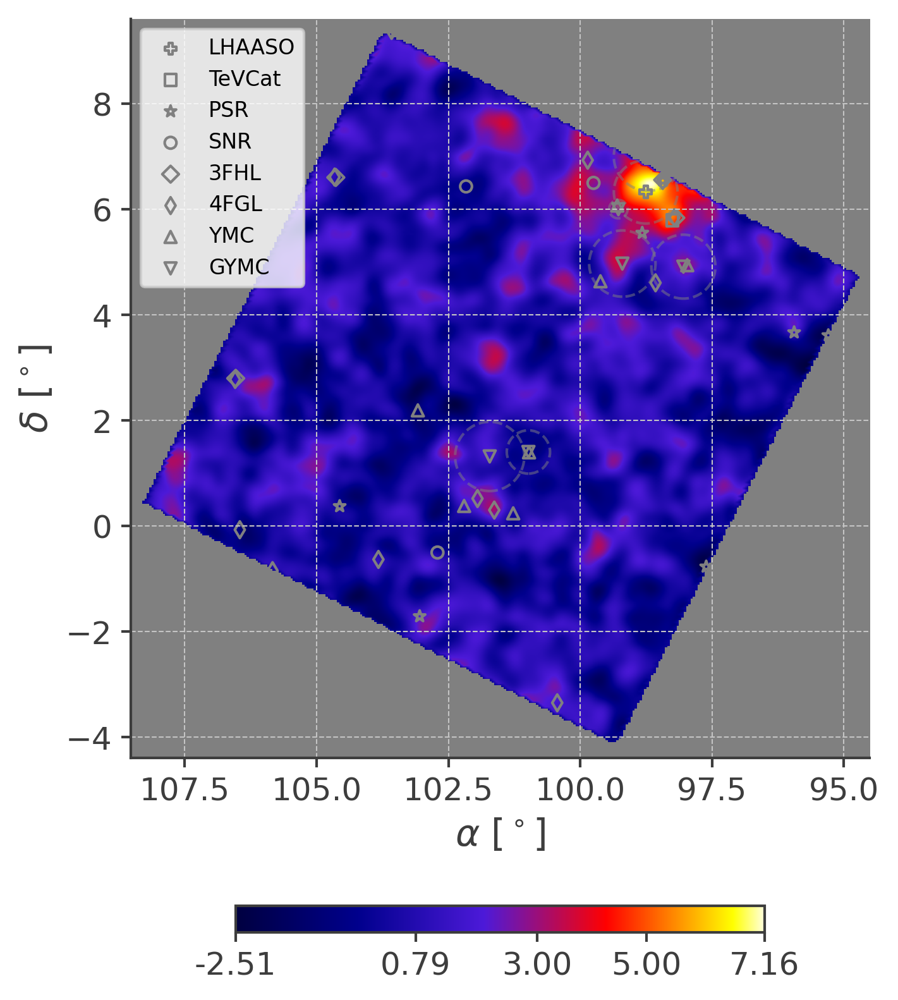

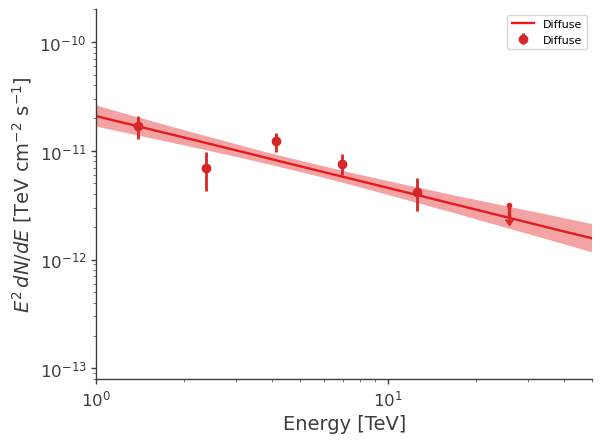

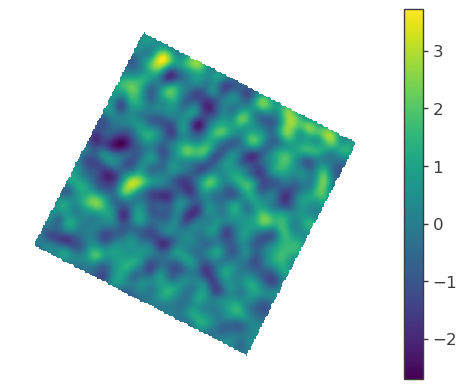

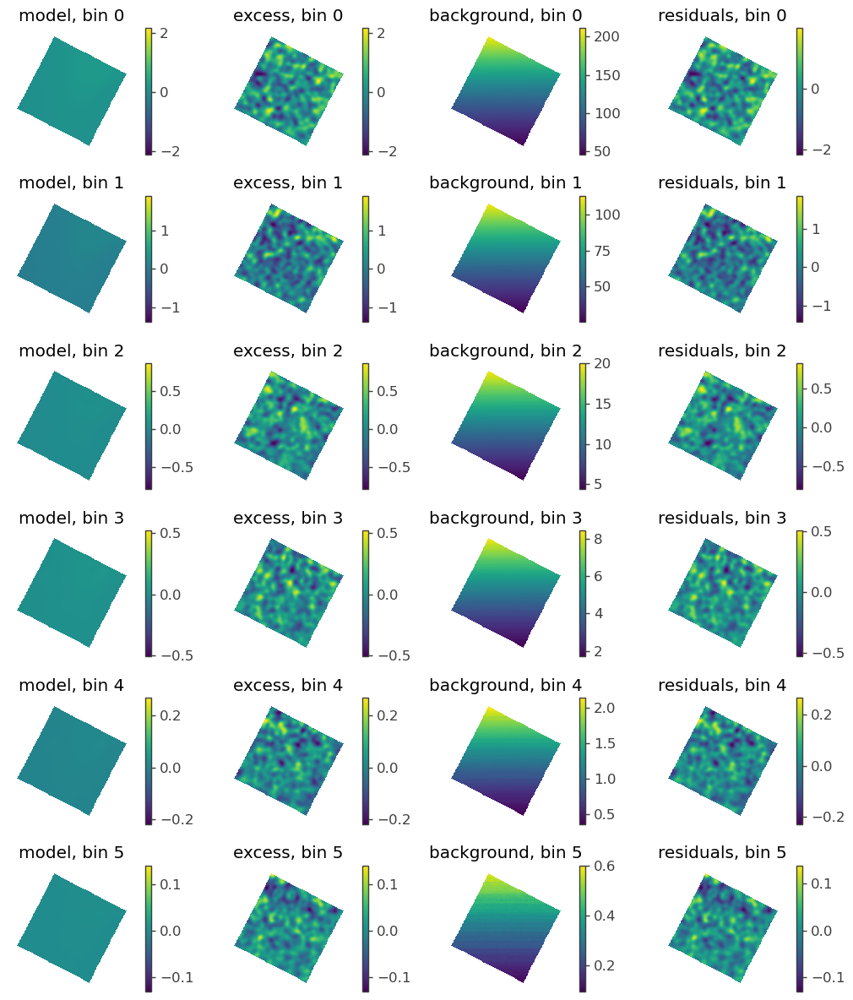

<Figure size 640x480 with 0 Axes>

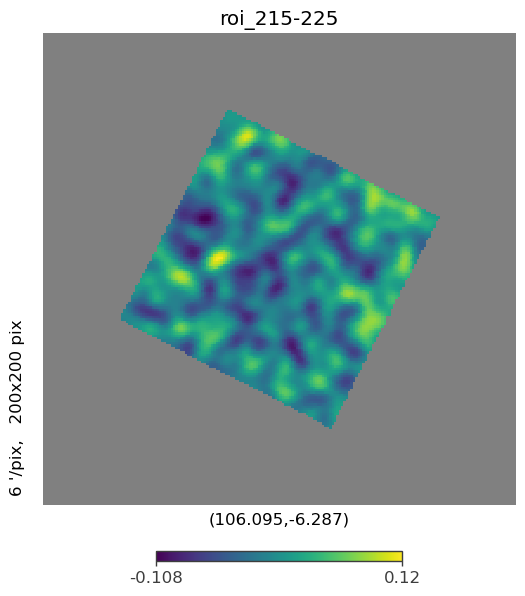

PSR:  1 103.04629166666666 -1.7084166666666667 J0652-0142
PSR:  2 104.563375 0.3764722222222222 J0658+0022
SNR:  1 102.70833333333333 -0.5 G213.0-00.6
3FHL:  1 100.020676 -12.900397 3FHL J0640.0-1254
3FHL:  2 107.447716 -2.931035 3FHL J0709.7-0255
3FHL:  3 110.29268 -2.3842797 3FHL J0721.1-0223
3FHL:  4 110.75446 -7.535653 3FHL J0723.0-0732
3FHL:  5 111.392876 -5.073363 3FHL J0725.5-0504
3FHL:  6 111.43205 -5.8146234 3FHL J0725.7-0548
3FHL:  7 111.46241 -0.94093764 3FHL J0725.8-0056
3FHL:  8 112.576195 -11.688636 3FHL J0730.3-1141
3FHL:  9 112.64841 -5.597354 3FHL J0730.5-0535
4FGL:  1 99.0717 -10.9585 4FGL J0636.2-1057
4FGL:  2 100.0213 -12.896 4FGL J0640.0-1253
4FGL:  3 100.4371 -3.3466 4FGL J0641.7-0320
4FGL:  4 101.6311 0.3035 4FGL J0646.5+0018
4FGL:  5 101.9494 0.5215 4FGL J0647.7+0031
4FGL:  6 103.8282 -0.631 4FGL J0655.3-0037
4FGL:  7 104.0765 -3.3686 4FGL J0656.3-0322
4FGL:  8 104.6788 -4.1187 4FGL J0658.7-0407c
4FGL:  9 105.3271 -4.0587 4FGL J0701.3-0403
4FGL:  10 105.3455 -3.

Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(7 +/- 5) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1110.287891
total,1110.287891


Values of statistical measures:

,statistical measures
AIC,2222.575805
BIC,2232.691777


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(7 +/- 5) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1127.178161
total,1127.178161


Values of statistical measures:

,statistical measures
AIC,2256.356345
BIC,2266.472318


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(1.2 +/- 0.7) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1104.651791
total,1104.651791


Values of statistical measures:

,statistical measures
AIC,2211.303604
BIC,2221.419577


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(3 +/- 8) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1105.486352
total,1105.486352


Values of statistical measures:

,statistical measures
AIC,2212.972726
BIC,2223.088699


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(9 +/- 10) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1073.363297
total,1073.363297


Values of statistical measures:

,statistical measures
AIC,2148.726616
BIC,2158.842589


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(0.9 +/- 1.1) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,993.601923
total,993.601923


Values of statistical measures:

,statistical measures
AIC,1989.203867
BIC,1999.319840


100%|██████████| 6/6 [01:27<00:00, 14.56s/it]


processing MLE analyses:   0%|          | 0/1 [00:00<?, ?it/s]

Propagating errors:   0%|          | 0/30 [00:00<?, ?it/s]


WARNING UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go" (-> color='g'). The keyword argument will take precedence.



14:48:25 INFO      Region of Interest:                                                                   ]8;id=337547;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=974727;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#292\292]8;;\

         INFO      -------------------                                                                   ]8;id=357156;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=118057;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#293\293]8;;\

         INFO      HealpixMapROI: Center (R.A., Dec) = (110.829, -15.142), model radius:     ]8;id=250098;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/region_of_interest/healpix_map_roi.py\healpix_map_roi.py]8;;\:]8;id=181379;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/region_of_interest/healpix_map_roi.py#134\134]8;;\
                  9.000 deg, display radius: 7.000 deg, threshold = 0.50                                           

         INFO                                                                                            ]8;id=947100;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=306096;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#296\296]8;;\

         INFO      Flat sky projection:                                                                  ]8;id=548466;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=851172;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#297\297]8;;\

         INFO      --------------------                                                                  ]8;id=505624;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=628158;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#298\298]8;;\

         INFO      Width x height 106 x 106 px                                                           ]8;id=624196;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=809162;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#300\300]8;;\

         INFO      Pixel sizes: 0.17 deg                                                                 ]8;id=169245;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=201338;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#305\305]8;;\

         INFO                                                                                            ]8;id=448562;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=255264;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#308\308]8;;\

         INFO      Response:                                                                             ]8;id=74084;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=121426;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#309\309]8;;\

         INFO      ---------                                                                             ]8;id=58237;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=377940;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#310\310]8;;\

         INFO      Response file:                                                                   ]8;id=14773;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=572333;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#340\340]8;;\
                  /data/home/cwy/Science/3MLWCDA/Standard/src/../../data/DR_ihep_MK2_newoldDRpsf.ro                
                  ot                                                                                               

         INFO      Number of dec bins: 110                                                          ]8;id=920313;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=108856;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#341\341]8;;\

         INFO      Number of energy/nHit planes per dec bin_name: 6                                 ]8;id=385940;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py\response.py]8;;\:]8;id=857825;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/response/response.py#344\344]8;;\

         INFO                                                                                            ]8;id=539812;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=106592;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#314\314]8;;\

         INFO      Map Tree:                                                                             ]8;id=677264;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=422996;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#315\315]8;;\

         INFO      ----------                                                                            ]8;id=150668;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=556505;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#316\316]8;;\

,Bin,Nside,Scheme,Obs counts,Bkg counts,obs/bkg,Pixels in ROI,Area (deg^2)
0,0,1024,RING,1.011686e+06,1.011617e+06,1.000068,29145,95.551614
1,1,1024,RING,5.624247e+05,5.626419e+05,0.999614,29145,95.551614
2,2,1024,RING,9.685184e+04,9.625157e+04,1.006237,29145,95.551614
3,3,1024,RING,3.595067e+04,3.602645e+04,0.997896,29145,95.551614
4,4,1024,RING,7.855107e+03,7.766349e+03,1.011429,29145,95.551614
5,5,1024,RING,2.118285e+03,2.200201e+03,0.962769,29145,95.551614


         INFO      This Map Tree contains 795.961 transits in the first bin                         ]8;id=791065;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py\map_tree.py]8;;\:]8;id=310370;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py#149\149]8;;\

         INFO      Total data size: 2.80 Mb                                                         ]8;id=420875;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py\map_tree.py]8;;\:]8;id=464870;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/maptree/map_tree.py#151\151]8;;\

         INFO                                                                                            ]8;id=665948;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=121557;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#320\320]8;;\

         INFO      Active energy/nHit planes (6):                                                        ]8;id=361205;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=101652;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#322\322]8;;\

         INFO      -------------------------------                                                       ]8;id=346861;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=73975;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#323\323]8;;\

         INFO      ['0', '1', '2', '3', '4', '5']                                                        ]8;id=128100;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py\HAL.py]8;;\:]8;id=341851;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/HAL.py#324\324]8;;\

14:48:26 INFO      Set WCDA tansit from: 795.9613310185185 to 796.2928263888889                         ]8;id=905376;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Mymap.py\Mymap.py]8;;\:]8;id=494710;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Mymap.py#41\41]8;;\

14:48:27 INFO      Set diffuse range: [222.0, 238.0] [-8, 8]                                          ]8;id=926585;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=717583;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1215\1215]8;;\

         INFO      ra dec coner:                                                                      ]8;id=547631;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=587445;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1216\1216]8;;\

         INFO      (99.77499090250942, -11.675274561200444)                                           ]8;id=774275;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=476040;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1217\1217]8;;\

         INFO      (107.16013648902141, -25.904613843563308)                                          ]8;id=627919;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=217169;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1218\1218]8;;\

         INFO      (122.2196998001529, -18.05638980511833)                                            ]8;id=525738;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=873105;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1219\1219]8;;\

         INFO      (114.13849643178527, -4.326695969018898)                                           ]8;id=782208;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=118839;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1220\1220]8;;\

         INFO      total sr: 0.06315473385935592                                                      ]8;id=746102;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=485600;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1259\1259]8;;\
                  ratio: 0.02299953923751283                                                                       

         INFO      integration: 2.991749116888233e-06                                                 ]8;id=591070;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=225458;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1260\1260]8;;\
                  ratio: 0.023609559141987816                                                                      

         INFO      set K to: 4.233095926321916e-13                                                    ]8;id=722050;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=371807;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1261\1261]8;;\

         INFO      diffuse file path: ../../data/Diffuse_WCDA_case14_dust_bkg_template.fits           ]8;id=377974;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py\Myfit.py]8;;\:]8;id=458201;file:///data/home/cwy/Science/3MLWCDA/Standard/src/./mylib/Myfit.py#1288\1288]8;;\

Model summary:
==============

                  N
Point sources     0
Extended sources  1
Particle sources  0

Free parameters (2):
--------------------

                                     value min_value max_value            unit
Diffuse.spectrum.main.Powerlaw.K       0.0       0.0       0.0  keV-1 s-1 cm-2
Diffuse.spectrum.main.Powerlaw.index  -2.5      -4.5      -0.5                

Fixed parameters (4):
---------------------

                                                                                value   
Diffuse.SpatialTemplate_2D.K                                                      1.0  \
Diffuse.SpatialTemplate_2D.hash     2640358489306089963689985374718219631409459689...   
Diffuse.SpatialTemplate_2D.ihdu                                                   0.0   
Diffuse.spectrum.main.Powerlaw.piv                                       3000000000.0   

                                   min_value max_value   unit  
Diffuse.SpatialTemplate_2D.K            None      None  deg-2  
Diffuse.SpatialTemplate_2D.hash         None      None         
Diffuse.SpatialTemplate_2D.ihdu          0.0      None         
Diffuse.spectrum.main.Powerlaw.piv      None      None    keV  

Properties (2):
--------------------

                                                                                  value   
Diffuse.SpatialTemplate_2D.fits_file  ../../data/Diffuse_WCDA_case14_dust_bkg_templa...  \
Diffuse.SpatialTemplate_2D.frame                                                   icrs   

                                                            allowed values  
Diffuse.SpatialTemplate_2D.fits_file                                  None  
Diffuse.SpatialTemplate_2D.frame      [icrs, galactic, fk5, fk4, fk4_no_e]  

Linked parameters (0):
----------------------

(none)

Independent variables:
----------------------

(none)

Linked functions (0):
----------------------

(none)

14:48:28 INFO      Considering 17 dec bins for extended source Diffuse              ]8;id=96645;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=757245;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = -13.826                     ]8;id=192753;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=498698;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\

         INFO      set the minimizer to minuit                                             ]8;id=670556;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py\joint_likelihood.py]8;;\:]8;id=223037;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py#1042\1042]8;;\

         INFO      set the minimizer to ROOT                                               ]8;id=992831;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py\joint_likelihood.py]8;;\:]8;id=432968;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/threeML/classicMLE/joint_likelihood.py#1059\1059]8;;\

Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.Powerlaw.K,(0.5 -0.4 +1.9) x 10^-21,1 / (keV s cm2)
Diffuse.spectrum.main.Powerlaw.index,-3.4 +/- 1.7,


Correlation matrix:

1.00,0.27
0.27,1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA,6018.063462
total,6018.063462


Values of statistical measures:

,statistical measures
AIC,12040.126994
BIC,12060.270521


Smoothing planes:   0%|          | 0/6 [00:00<?, ?it/s]

14:48:38 INFO      Considering 17 dec bins for extended source Diffuse              ]8;id=451351;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=903428;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#93\93]8;;\

         INFO      Central bin is bin at Declination = -13.826                     ]8;id=853211;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py\convolved_extended_source.py]8;;\:]8;id=977160;file:///data/home/cwy/.mylib/miniconda3/envs/3ML/lib/python3.9/site-packages/WCDA_hal/convolved_source/convolved_extended_source.py#102\102]8;;\


WARNING RuntimeWarning: invalid value encountered in sqrt



(114.25781249999999, -16.529274787336007)


<Figure size 640x480 with 0 Axes>

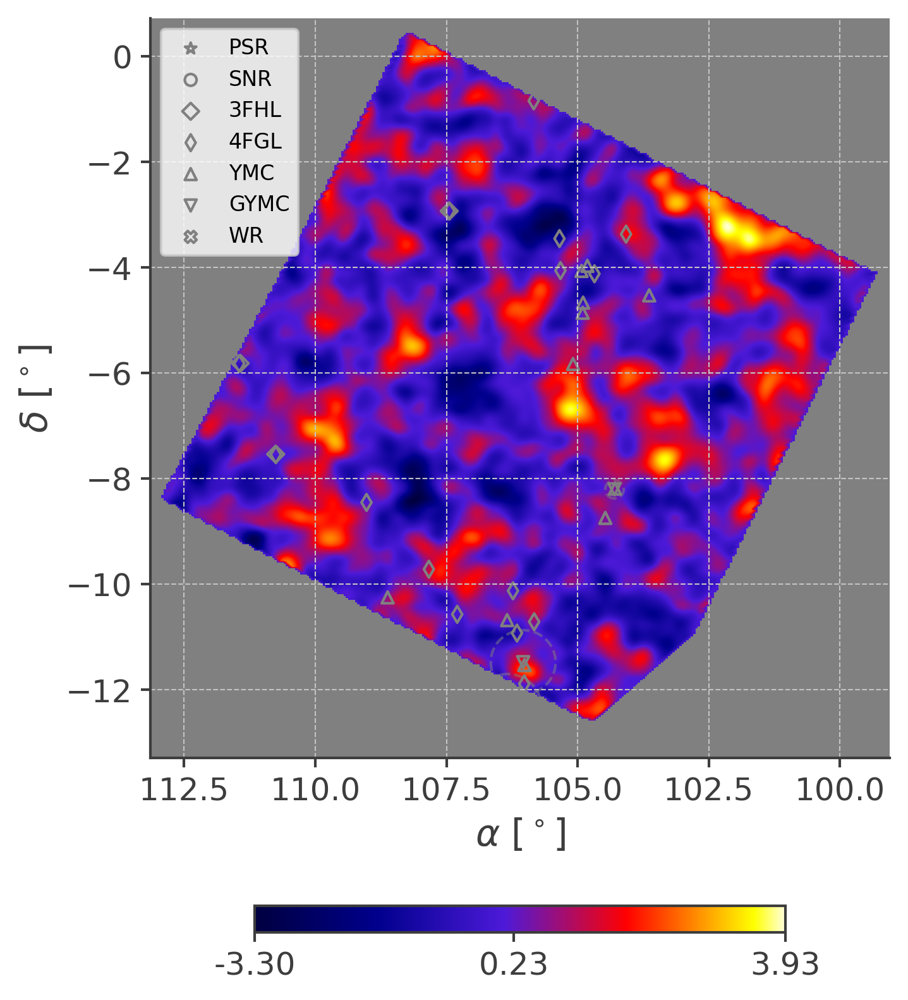

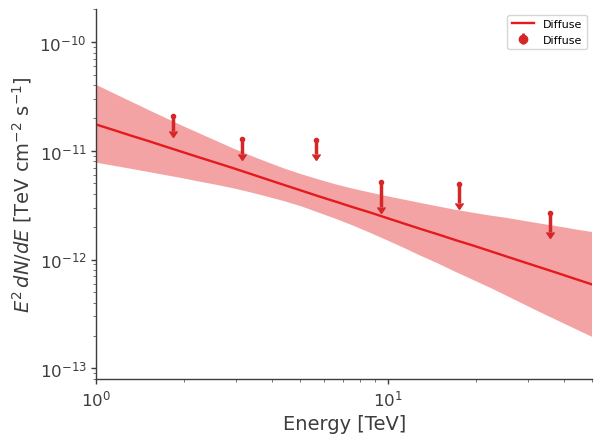

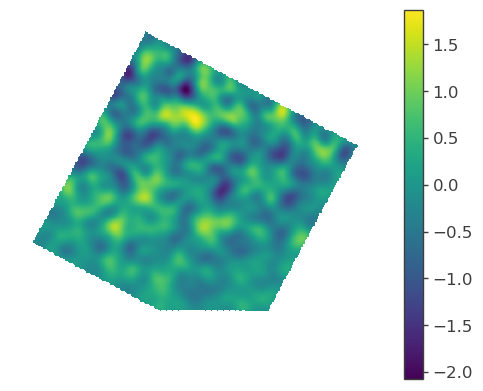

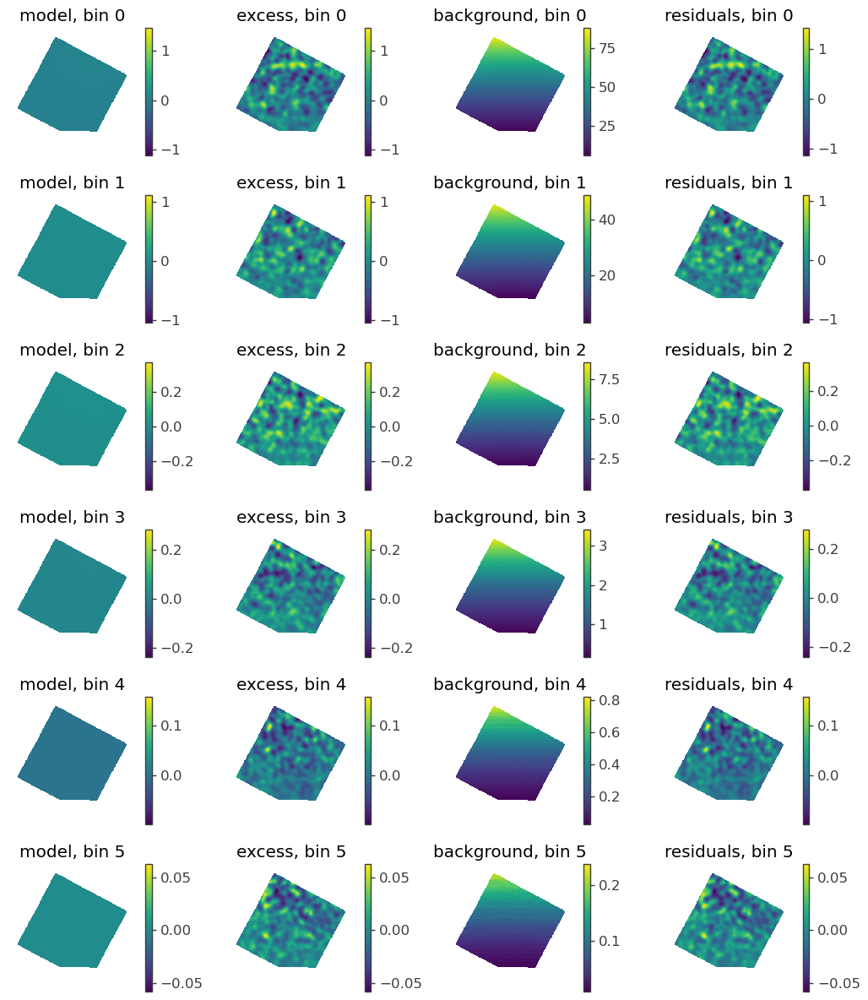

<Figure size 640x480 with 0 Axes>

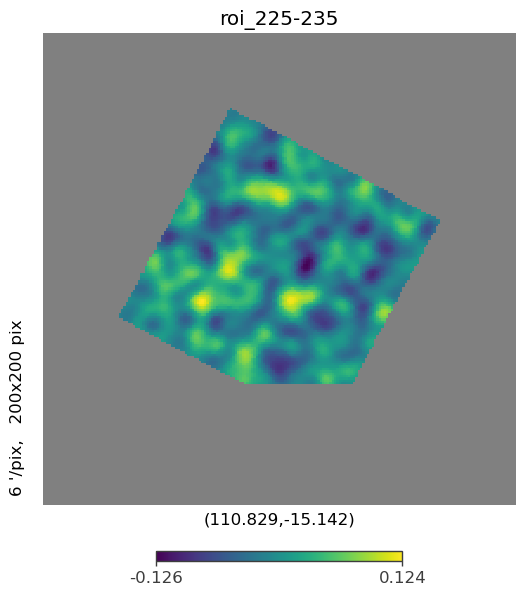

PSR:  1 110.42875 -20.635305555555554 J0721-2038
PSR:  2 111.25166666666665 -16.596055555555555 J0725-1635
PSR:  3 112.31854166666666 -14.810222222222222 J0729-1448
PSR:  4 112.38479166666664 -18.611861111111114 J0729-1836
PSR:  5 113.49999999999999 -15.983333333333333 J0734-1559
PSR:  6 114.43362499999999 -22.034805555555558 J0737-2202
3FHL:  1 105.66014 -19.845638 3FHL J0702.6-1950
3FHL:  2 107.29887 -15.43226 3FHL J0709.1-1525
3FHL:  3 112.576195 -11.688636 3FHL J0730.3-1141
3FHL:  4 113.67249 -16.003048 3FHL J0734.6-1600
4FGL:  1 104.8224 -17.9747 4FGL J0659.2-1758c
4FGL:  2 105.678 -19.8517 4FGL J0702.7-1951
4FGL:  3 105.8287 -10.7092 4FGL J0703.3-1042
4FGL:  4 106.0177 -11.8863 4FGL J0704.0-1153c
4FGL:  5 106.1553 -10.9241 4FGL J0704.6-1055c
4FGL:  6 106.2319 -10.1229 4FGL J0704.9-1007c
4FGL:  7 107.295 -10.5693 4FGL J0709.1-1034c
4FGL:  8 107.3095 -15.4512 4FGL J0709.2-1527
4FGL:  9 107.8352 -9.7145 4FGL J0711.3-0942
4FGL:  10 108.9266 -11.48 4FGL J0715.7-1128
4FGL:  11 109.0239

Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(5 +/- 9) x 10^-22,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1061.625439
total,1061.625439


Values of statistical measures:

,statistical measures
AIC,2125.250901
BIC,2135.322676


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(-0.5 +/- 1.4) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1076.014615
total,1076.014615


Values of statistical measures:

,statistical measures
AIC,2154.029254
BIC,2164.101029


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(5.6 +/- 3.1) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1081.311349
total,1081.311349


Values of statistical measures:

,statistical measures
AIC,2164.622720
BIC,2174.694495


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(0 +/- 4) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,1012.777828
total,1012.777828


Values of statistical measures:

,statistical measures
AIC,2027.555678
BIC,2037.627454


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(5 +/- 6) x 10^-21,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,993.181637
total,993.181637


Values of statistical measures:

,statistical measures
AIC,1988.363297
BIC,1998.435072


Best fit values:

,result,unit
parameter,,
Diffuse.spectrum.main.PowerlawM.K,(-1.8 +/- 0.9) x 10^-20,1 / (keV s cm2)


Correlation matrix:

1.00


Values of -log(likelihood) at the minimum:

,-log(likelihood)
WCDA_1,789.207525
total,789.207525


Values of statistical measures:

,statistical measures
AIC,1580.415073
BIC,1590.486848


100%|██████████| 6/6 [01:04<00:00, 10.68s/it]


processing MLE analyses:   0%|          | 0/1 [00:00<?, ?it/s]

Propagating errors:   0%|          | 0/30 [00:00<?, ?it/s]


WARNING UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go" (-> color='g'). The keyword argument will take precedence.



<Figure size 640x480 with 0 Axes>

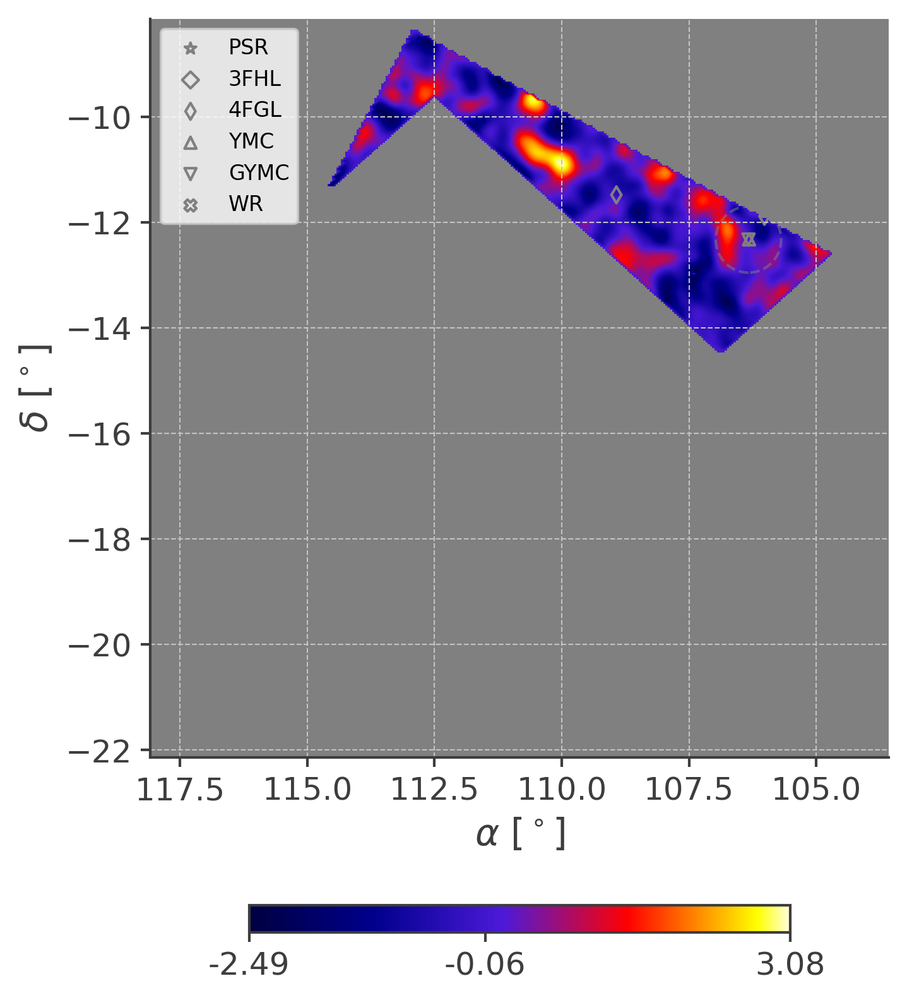

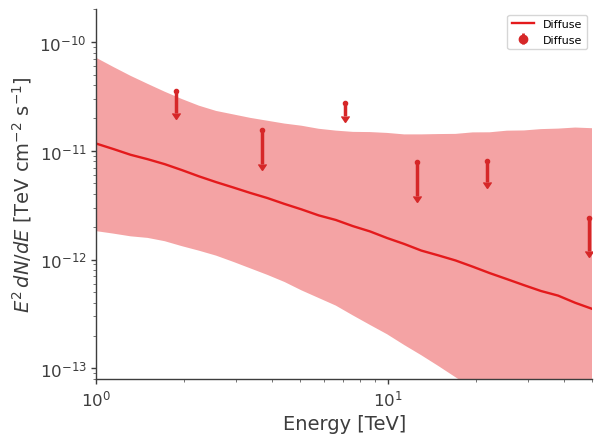

In [35]:
%matplotlib inline
#####   Data Initialize
# activate_warnings()

# maptree = "../../data/gcd_new.root"
# response="../../data/WCDA_DR_psf.root"

# maptree =  "../../data/hsc2healpix_20210305_20220930.root"
# response = "../../data/WCDA_DR2.root"

# maptree =  "../../data/20210305_20230731_ihep_no_goodlist.root"
# response = "../../data/DR_ihep_MK2.root"

# maptree =  "../../data/20210305_20230731_ihep_goodlist.root"
# response = "../../data/DR_ihep_MK2_newpsf.root"

maptree =  "../../data/20210305-20230731_trans_fromhsc.root"
response = "../../data/DR_ihep_MK2_newoldDRpsf.root"


region_name="Diffuse_WCDA_case14"
if not os.path.exists(f'../res/{region_name}/'):
    os.system(f'mkdir ../res/{region_name}/')


nside=2**10
npix=hp.nside2npix(nside)
pixarea = 4 * np.pi/npix
pixIdx = hp.nside2npix(nside) # number of pixels I can get from this nside
pixIdx = np.arange(pixIdx) # pixel index numbers
new_lats = hp.pix2ang(nside, pixIdx)[0] # thetas I need to populate with interpolated theta values
new_lons = hp.pix2ang(nside, pixIdx)[1] # phis, same
c_icrs = SkyCoord(ra=new_lons*180/np.pi*u.degree, dec=90*u.degree-new_lats*180/np.pi*u.degree, frame='icrs')
c_l=c_icrs.galactic.l.deg
c_b=c_icrs.galactic.b.deg

resultsall = []
for i,gl in enumerate(range(100,360,10)): # #!!!!!!!!!!!!!!!!!!!365    
    c_gal = SkyCoord(l=(gl)*u.degree, b=0*u.degree, frame='galactic')
    RA_center=c_gal.icrs.ra.deg
    Dec_center=c_gal.icrs.dec.deg
    if (Dec_center<-20. or Dec_center>80.): continue
    signal=np.zeros(npix,dtype=np.float64)
    mask = ( (c_l< gl + 5) & (c_l > gl - 5) & (c_b <5.) & (c_b>-5) & (90-new_lats/np.pi*180>-20) & (90-new_lats/np.pi*180<80)) #&(new_lats<110/180*np.pi )  & (new_lats > 10/180*np.pi )
        
    signal[mask]=1
    # hp.mollview(signal,title="ROI",norm='hist')
    # hp.graticule()
    ra1,dec1=RA_center, Dec_center

    data_radius = 7
    model_radius = 9

    roi = HealpixMapROI(ra=ra1,dec=dec1, data_radius=data_radius, model_radius=model_radius, roimap=signal)

    WCDA = HAL("WCDA", maptree, response, roi, flat_sky_pixels_size=0.17)

    #####   Data Situation
    %matplotlib inline
    WCDA.set_active_measurements(0, 5)
    WCDA.display()
    WCDA.psf_integration_method="exact"

    my.settransWCDA(WCDA, ra1, dec1)

    Modelname=f"roi_{gl - 5}-{gl + 5}"
    if not os.path.exists(f'../res/{region_name}/{Modelname}/'):
        os.system(f'mkdir ../res/{region_name}/{Modelname}/')
    fig = WCDA.display_stacked_image(smoothing_kernel_sigma=0.25)
    fig.savefig(f"../res/{region_name}/{Modelname}_counts_all.png",dpi=300)

    lm = my.getcatModel(ra1, dec1, data_radius, model_radius, rtsigma=8, rtflux=20, rtindex=10, rtp=8,  detector="WCDA", roi=roi, pf=True, sf=True, kf=False, indexf=False,  mkf=True, mindexf=True, setdeltabypar=True, ifext_mt_2=True) #indexb=(-4,-1),

    Diffuse, diffscaleratio = my.set_diffusebkg(
                ra1, dec1, 8, 8, Kf=False, indexf=False, name=region_name, ifreturnratio=True, Kb=(1e-18, 1e-10), indexb=(-4.5, -0.5), index=-2.5, setdeltabypar=True #
                ) #Kn=1 , K=1e-12
    
    lm.add_source(Diffuse)

    lm.save(f"../res/{region_name}/{Modelname}/Model_init.yml", overwrite=True)
    lm.display(complete=True)

    result = my.fit(region_name, Modelname, WCDA, lm, 0, 5, mini="ROOT", donwtlimit=True) # , ifgeterror=True
    sources = my.get_sources(lm,result)
    resultsall.append([result, sources, diffscaleratio])

    resu = my.getressimple(WCDA, lm)
    new_source_idx = np.where(resu==np.ma.max(resu))[0][0]
    new_source_lon_lat=hp.pix2ang(1024,new_source_idx,lonlat=True)
    print(new_source_lon_lat)

    plt.figure()
    hp.gnomview(resu,norm='',rot=[ra1,dec1],xsize=200,ysize=200,reso=6,title=Modelname)
    plt.scatter(new_source_lon_lat[0],new_source_lon_lat[1],marker='x',color='red')
    plt.show()
    plt.savefig(f"../res/{region_name}/{Modelname}_res.png",dpi=300)

    map2, skymapHeader = hp.read_map("../../data/fullsky_WCDA_llh-2.6.fits.gz",h=True)
    map2 = my.maskroi(map2, roi)
    sources.pop("Diffuse")
    fig = my.drawmap(region_name, Modelname, sources, map2, ra1, dec1, rad=2*data_radius, contours=[10000],save=1, 
                    color="Fermi",
                    colors = my.colorall
                    )
    # try:
    Flux_WCDA0, jls0  = my.getdatapoint(WCDA, lm, maptree, response, roi, "Diffuse", ifpowerlawM=1, iffixtans=1)
    import matplotlib as mpl

    x_Max=50.
    x_Min=1
    y_Min=0.8e-13
    y_Max=2e-10
    fig,ax = plt.subplots()
    plot_spectra(
        result[0].results,
        sources_to_use=["Diffuse"], #,"ext1","ext2","ext4","ext5","ext6","ext7"|
        include_extended=True,
        ene_min=x_Min,
        ene_max=x_Max,
        num_ene=30,
        energy_unit="TeV",
        flux_unit="TeV/(s cm2)",
        subplot=ax,
        )

    my.Draw_sepctrum_points(region_name, Modelname, Flux_WCDA0,"Diffuse","tab:red")

    ax.set_xlim(x_Min,x_Max)
    ax.set_ylim(y_Min,y_Max)
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_ylabel(r"$E^2\,dN/dE$ [TeV cm$^{-2}$ s$^{-1}$]")
    ax.set_xlabel("Energy [TeV]")
    plt.legend()
    plt.savefig(f'../res/{region_name}/{Modelname}/Spectrum.png', dpi=300)
    plt.savefig(f'../res/{region_name}/{Modelname}/Spectrum.pdf')
    # except:   pass
    #     continue

roi_15-25


processing MLE analyses:   0%|          | 0/1 [00:00<?, ?it/s]

Propagating errors:   0%|          | 0/30 [00:00<?, ?it/s]


WARNING UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go" (-> color='g'). The keyword argument will take precedence.



roi_25-35


processing MLE analyses:   0%|          | 0/1 [00:00<?, ?it/s]

Propagating errors:   0%|          | 0/30 [00:00<?, ?it/s]


WARNING UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go" (-> color='g'). The keyword argument will take precedence.



roi_35-45


processing MLE analyses:   0%|          | 0/1 [00:00<?, ?it/s]

Propagating errors:   0%|          | 0/30 [00:00<?, ?it/s]


WARNING UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go" (-> color='g'). The keyword argument will take precedence.



roi_45-55


processing MLE analyses:   0%|          | 0/1 [00:00<?, ?it/s]

Propagating errors:   0%|          | 0/30 [00:00<?, ?it/s]


WARNING UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go" (-> color='g'). The keyword argument will take precedence.



roi_55-65


processing MLE analyses:   0%|          | 0/1 [00:00<?, ?it/s]

Propagating errors:   0%|          | 0/30 [00:00<?, ?it/s]


WARNING UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go" (-> color='g'). The keyword argument will take precedence.



roi_65-75


processing MLE analyses:   0%|          | 0/1 [00:00<?, ?it/s]

Propagating errors:   0%|          | 0/30 [00:00<?, ?it/s]


WARNING UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go" (-> color='g'). The keyword argument will take precedence.



roi_75-85


processing MLE analyses:   0%|          | 0/1 [00:00<?, ?it/s]

Propagating errors:   0%|          | 0/30 [00:00<?, ?it/s]


WARNING UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go" (-> color='g'). The keyword argument will take precedence.



roi_85-95
roi_95-105
roi_105-115
roi_115-125
roi_125-135
roi_135-145
roi_145-155
roi_155-165
roi_165-175
roi_175-185
roi_185-195
roi_195-205
roi_205-215
roi_215-225
roi_225-235


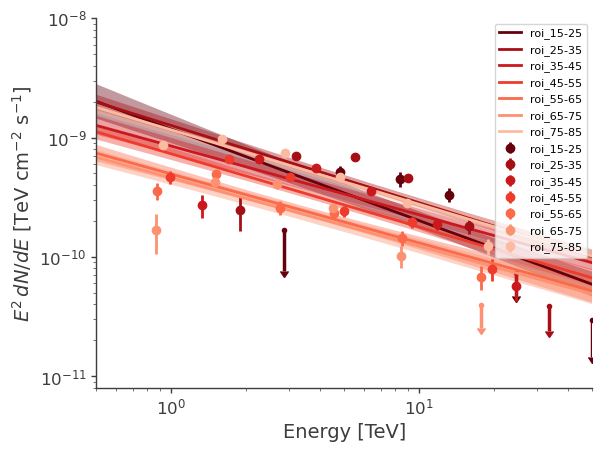

In [36]:
%matplotlib inline
import glob
gc = []
dk = []
dkf = []
de = []
di = []
die = []
den = []
dep = []
dien = []
diep = []
ss = []
ssr= []
x_Max=50.
x_Min=0.5
y_Min=0.8e-11
y_Max=1e-8
fig,ax = plt.subplots()
folder_path = f"/data/home/cwy/Science/3MLWCDA/Standard/res/{region_name}"
subfolders = glob.glob(folder_path + '/**/', recursive=True)
sorted_files = sorted(subfolders[1:], key=lambda x: int(x.split('_')[-1].split('-')[-2]))
# 打印所有找到的子文件夹路径
for i,subfolder in enumerate(sorted_files): #[:7]
    name = subfolder.split("/")[-2]
    print(name)
    specpath = subfolder+"Results.fits"
    resultsss = load_analysis_results(specpath)
    resultdict = resultsss.get_data_frame()
    gc.append(range(20,360,10)[i])
    dk.append(resultdict.loc["Diffuse.spectrum.main.Powerlaw.K"]["value"])
    de.append(resultdict.loc["Diffuse.spectrum.main.Powerlaw.K"]["error"])
    den.append(abs(resultdict.loc["Diffuse.spectrum.main.Powerlaw.K"]["negative_error"]))
    dep.append(abs(resultdict.loc["Diffuse.spectrum.main.Powerlaw.K"]["positive_error"]))
    di.append(resultdict.loc["Diffuse.spectrum.main.Powerlaw.index"]["value"])
    die.append(resultdict.loc["Diffuse.spectrum.main.Powerlaw.index"]["error"])
    dien.append(abs(resultdict.loc["Diffuse.spectrum.main.Powerlaw.index"]["negative_error"]))
    diep.append(abs(resultdict.loc["Diffuse.spectrum.main.Powerlaw.index"]["positive_error"]))
    try:
        dkf.append(resultsall[i][2][0])
    except:
        resultfile = np.load(f"../res/Diffuse_WCDA_case10/resultsall.npy")
        dkf = resultfile[9]
    if i < 7:
        # try:
        plot_spectra(
            resultsss,
            sources_to_use=["Diffuse"],
            include_extended=True,
            ene_min=x_Min,
            ene_max=x_Max,
            num_ene=30,
            energy_unit="TeV",
            flux_unit=f"TeV/(s cm2)", #*
            subplot=ax,
            plot_style_kwargs={"label":name, "color":my.red_palette[-(i+1)], "scale":1/dkf[i]} #
            )
        try:
            data = my.Draw_spectrum_fromfile(subfolder+"Spectrum_Diffuse.txt", label=name, color=my.red_palette[-(i+1)], subplot=ax, scale=1/dkf[i])
            my.spec2naima(f"./spec_{name}.txt", data)
        except:
            pass
        # except Exception as e:
        #     print(f"Error: {e}")
        #     continue
results=[gc,dk,de,den,dep,di,die,dien,diep, dkf]
np.save(f"../res/{region_name}/resultsall.npy",results)
from threeML.analysis_results import AnalysisResultsSet
resultsall
rrr = [it[0][0].results for it in resultsall]
analysis_set = AnalysisResultsSet(rrr)

ax.set_xlim(x_Min,x_Max)
ax.set_ylim(y_Min,y_Max)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylabel(r"$E^2\,dN/dE$ [TeV cm$^{-2}$ s$^{-1}$]")
ax.set_xlabel("Energy [TeV]")
ax.legend()
plt.savefig(f"../res/{region_name}/spectrum_band10-70.png",dpi=300)
plt.savefig(f"../res/{region_name}/spectrum_band10-70.pdf",dpi=300)

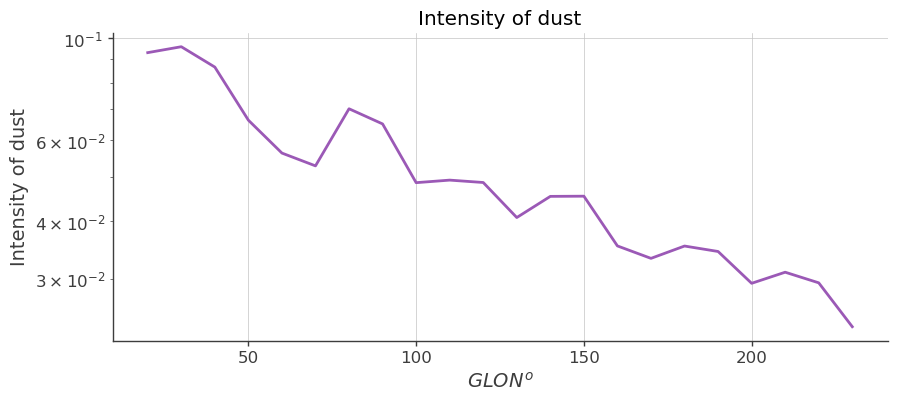

In [37]:
plt.figure(figsize=(10,4)) #
plt.plot(gc, np.array(dkf)) #np.array(den)*1e9, np.array(dep)*1e9 , fmt="o"
plt.yscale("log")
plt.title("Intensity of dust")

plt.ylabel(r"Intensity of dust")
# plt.ylim(1e-7, 1e-4)
plt.grid()
plt.xlabel(r"$GLON^{o}$")
plt.savefig(f"../res/{region_name}/dust.png",dpi=300)
plt.savefig(f"../res/{region_name}/dust.pdf",dpi=300)

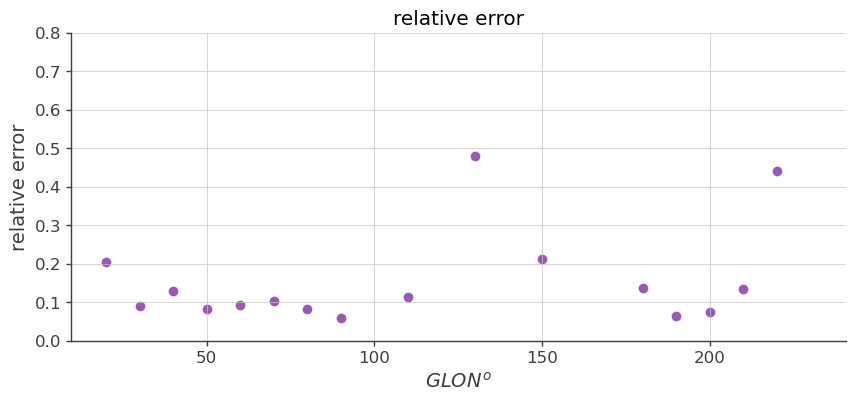

In [38]:
plt.figure(figsize=(10,4)) #
plt.scatter(gc, (np.array(de)*1e9)/(np.array(dk)*1e9), marker="o") #np.array(den)*1e9, np.array(dep)*1e9
# plt.yscale("log")
plt.title("relative error")
plt.ylim(0, 0.8)
plt.ylabel("relative error")
plt.grid()
plt.xlabel(r"$GLON^{o}$")
plt.savefig(f"../res/{region_name}/flux.png",dpi=300)
plt.savefig(f"../res/{region_name}/flux.pdf",dpi=300)

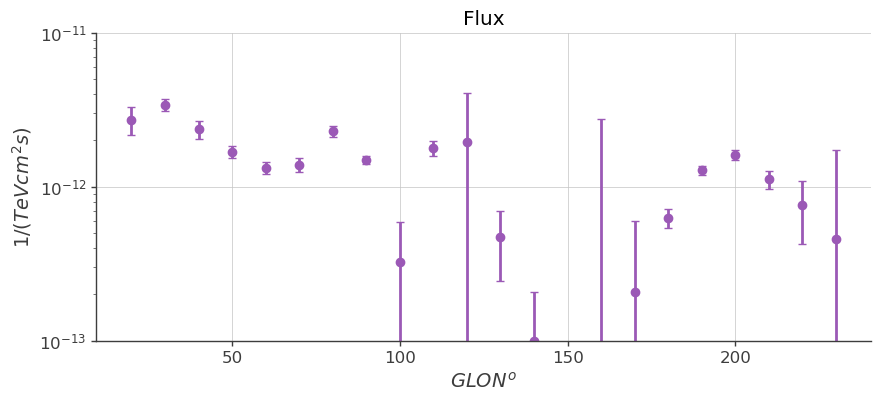

In [39]:
plt.figure(figsize=(10,4)) #
plt.errorbar(gc, np.array(dk)*1e9, [np.array(de)*1e9, np.array(de)*1e9], fmt="o", capsize=3) #np.array(den)*1e9, np.array(dep)*1e9
plt.yscale("log")
plt.title("Flux")
plt.ylim(1e-13, 1e-11)
plt.ylabel(r"$1/(TeV cm^{2} s)$")
plt.grid()
plt.xlabel(r"$GLON^{o}$")
plt.savefig(f"../res/{region_name}/flux.png",dpi=300)
plt.savefig(f"../res/{region_name}/flux.pdf",dpi=300)

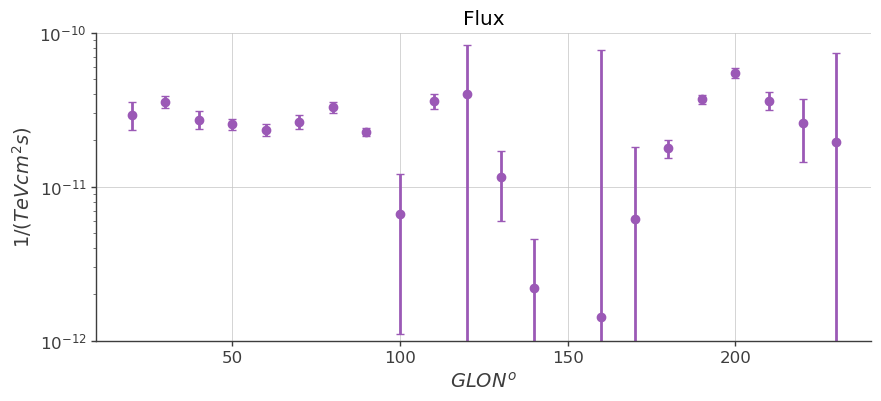

In [40]:
plt.figure(figsize=(10,4)) #
plt.errorbar(gc, np.array(dk)*1e9/np.array(dkf), [np.array(de)*1e9/np.array(dkf), np.array(de)*1e9/np.array(dkf)], fmt="o", capsize=3) #np.array(den)*1e9, np.array(dep)*1e9
plt.yscale("log")
plt.title("Flux")
plt.ylim(1e-12, 1e-10)
plt.ylabel(r"$1/(TeV cm^{2} s)$")
plt.grid()
plt.xlabel(r"$GLON^{o}$")
plt.savefig(f"../res/{region_name}/flux_fullsky.png",dpi=300)
plt.savefig(f"../res/{region_name}/flux_fullsky.pdf",dpi=300)

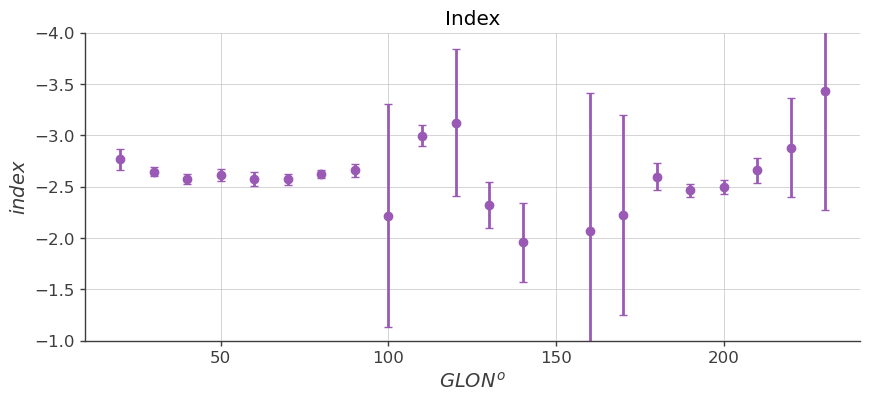

In [41]:
plt.figure(figsize=(10,4)) #
plt.errorbar(gc, di, [die, die], fmt="o", capsize=3) #dien, diep
plt.ylim(-1,-4)
plt.title("Index")
plt.ylabel(r"$index$")
plt.xlabel(r"$GLON^{o}$")
plt.grid()
plt.savefig(f"../res/{region_name}/index.png",dpi=300)
plt.savefig(f"../res/{region_name}/index.pdf",dpi=300)

In [17]:
my.edm2gal(105.8300, 14.1)

(201.6116100137915, 8.964129116200734)

In [ ]:
%matplotlib inline
import glob
x_Max=50.
x_Min=0.5
y_Min=0.8e-11
y_Max=1e-8
fig,ax = plt.subplots()
folder_path = f"/data/home/cwy/Science/3MLWCDA/Standard/res/{region_name}"
subfolders = glob.glob(folder_path + '/**/', recursive=True)
sorted_files = sorted(subfolders[1:], key=lambda x: int(x.split('_')[-1].split('-')[-2]))
# 打印所有找到的子文件夹路径
for i,subfolder in enumerate(sorted_files[6:14]):
    name = subfolder.split("/")[-2]
    print(name)
    specpath = subfolder+"Results.fits"
    resultsss = load_analysis_results(specpath)
    # try:
    plot_spectra(
        resultsss,
        sources_to_use=["Diffuse"],
        include_extended=True,
        ene_min=x_Min,
        ene_max=x_Max,
        num_ene=30,
        energy_unit="TeV",
        flux_unit=f"TeV/(s cm2)", #*
        subplot=ax,
        plot_style_kwargs={"label":name, "color":my.red_palette[-(i+1)], "scale":1/dkf[i+6]} #
        )
    # except Exception as e:
    #     print(f"Error: {e}")
    #     continue
    

ax.set_xlim(x_Min,x_Max)
ax.set_ylim(y_Min,y_Max)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylabel(r"$E^2\,dN/dE$ [TeV cm$^{-2}$ s$^{-1}$]")
ax.set_xlabel("Energy [TeV]")
ax.legend()
plt.savefig(f"../res/{region_name}/spectrum_band70-150.png",dpi=300)
plt.savefig(f"../res/{region_name}/spectrum_band70-150.pdf",dpi=300)